In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from tqdm import tqdm
from sklearn.decomposition import PCA
from sklearn import metrics

In [2]:
df = pd.read_csv("dataset/user_profiles.csv", index_col=0)

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2353593986 to 933183398
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   name                    11508 non-null  object 
 1   lang                    11508 non-null  object 
 2   bot                     11508 non-null  int64  
 3   created_at              11508 non-null  object 
 4   statuses_count          11508 non-null  int64  
 5   avg_length              11508 non-null  float64
 6   avg_special_chars       11508 non-null  float64
 7   urls_ratio              11508 non-null  float64
 8   mentions_ratio          11508 non-null  float64
 9   hashtags_ratio          11508 non-null  float64
 10  reply_count_mean        11508 non-null  float64
 11  reply_count_std         11508 non-null  float64
 12  reply_count_entropy     11508 non-null  float64
 13  favorite_count_mean     11508 non-null  float64
 14  favorite_count_std      1

In [4]:
# remove categorical features
cat_features = ["name", "lang", "bot", "created_at"]
df_cat = df[cat_features]
df_num = df.loc[:, ~df.columns.isin(cat_features)]

In [5]:
df_cat.head()

,name,lang,bot,created_at
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56
466124818,Carletto Focia,it,1,2017-01-18 02:49:18
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21


In [6]:
df_num.head()

,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,reply_count_entropy,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std,retweet_count_entropy
2353593986,76,62.340909,14.015152,0.0,0.272727,0.0,0.0,0.0,0.0,0.037879,0.190903,1.609438,0.037879,0.190903,1.609438
2358850842,4,69.082645,15.041322,0.0,0.338843,0.0,0.0,0.0,0.0,0.049587,0.217090,1.791759,0.024793,0.155495,1.098612
137959629,7,19.250000,5.250000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
466124818,50,86.944871,18.689463,0.0,0.004885,0.0,0.0,0.0,0.0,0.130495,0.336848,5.231109,0.150035,1.326298,3.554720
2571493866,8,72.311246,14.582073,0.0,0.448996,0.0,0.0,0.0,0.0,0.053341,0.224712,5.267858,0.016772,0.142619,3.965939


## Preprocessing

In [7]:
scaler = StandardScaler()

In [8]:
X = scaler.fit_transform(df_num.values)

In [9]:
sse_list = list()
max_k = 80
for k in tqdm(range(2, max_k + 1)):
    kmeans = KMeans(n_clusters=k, n_init=10, max_iter=100)
    kmeans.fit(X)
    
    sse = kmeans.inertia_
    sse_list.append(sse)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 79/79 [00:30<00:00,  2.60it/s]


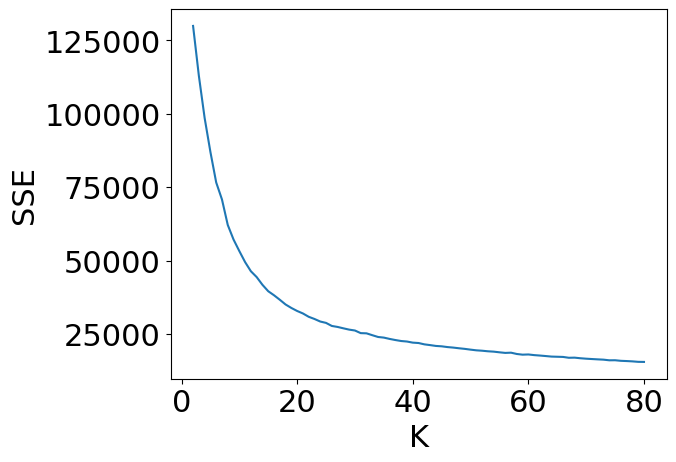

In [10]:
plt.plot(range(2, len(sse_list) + 2), sse_list)
plt.ylabel('SSE', fontsize=22)
plt.xlabel('K', fontsize=22)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

In [11]:
selected_k = 15

In [12]:
kmeans = KMeans(n_clusters=selected_k, n_init=100, max_iter=500)
kmeans.fit(X)

KMeans(max_iter=500, n_clusters=15, n_init=100)

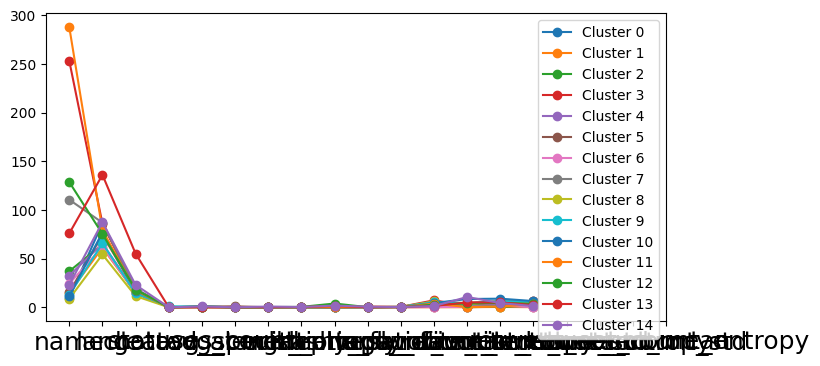

In [13]:
centers = scaler.inverse_transform(kmeans.cluster_centers_)
plt.figure(figsize=(8, 4))
for i in range(0, len(centers)):
    plt.plot(centers[i], marker='o', label='Cluster %s' % i)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.xticks(range(0, len(df.columns)), df.columns, fontsize=18)
plt.legend(fontsize=10)
plt.show()

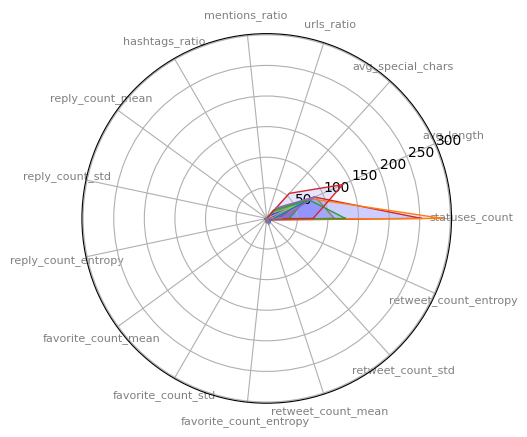

In [14]:
from math import pi
 
# number of variable
N = len(df_num.columns)
# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
for i in range(0, len(centers)):
    angles = [n / float(N) * 2 * pi for n in range(N)]
    values = centers[i].tolist()
    values += values[:1]
    angles += angles[:1]
# Initialise the spider plot
    ax = plt.subplot(polar=True)
# Draw one axe per variable + add labels labels yet
    plt.xticks(angles[:-1], df_num.columns, color='grey', size=8) 
# Plot data
    ax.plot(angles, values, linewidth=1, linestyle='solid')
 # Fill area
    ax.fill(angles, values, 'b', alpha=0.1)

In [15]:
print('SSE %s' % kmeans.inertia_)
print('Silhouette %s' % silhouette_score(X, kmeans.labels_))
print('Separation %s' % metrics.davies_bouldin_score(X, kmeans.labels_))

SSE 39545.40389553592
Silhouette 0.3728338880926001
Separation 1.0985885372693638


## Distribution of CategoricalFeatures per Cluster

In [16]:
cat_features

['name', 'lang', 'bot', 'created_at']

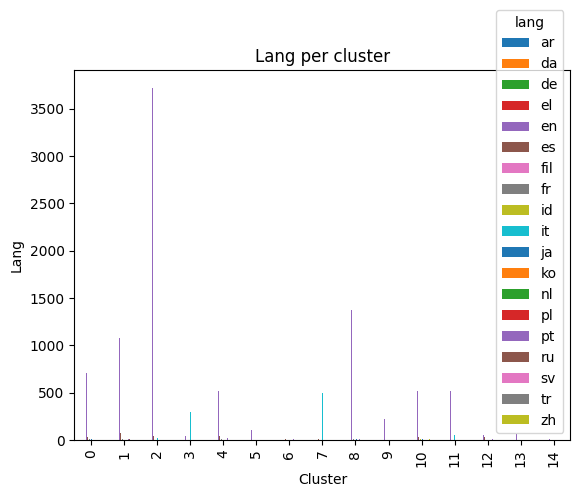

In [17]:
bot_xt_pct = pd.crosstab(kmeans.labels_,df_cat['lang'])
bot_xt_pct.plot(kind='bar', stacked=False, 
                   title='Lang per cluster')
plt.xlabel('Cluster')
plt.ylabel('Lang')
plt.show()

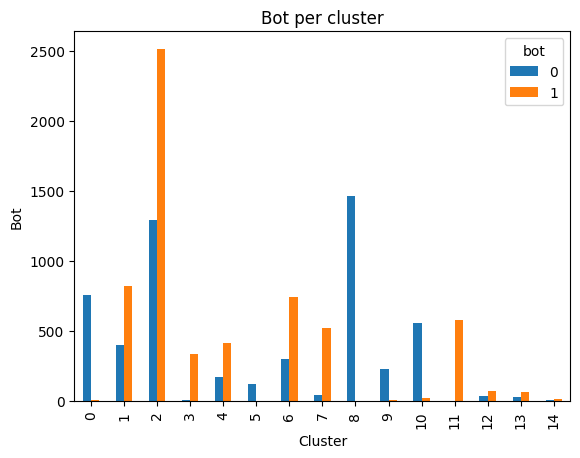

In [18]:
bot_xt_pct = pd.crosstab(kmeans.labels_,df_cat['bot'])
bot_xt_pct.plot(kind='bar', stacked=False, 
                   title='Bot per cluster')
plt.xlabel('Cluster')
plt.ylabel('Bot')
plt.show()

In [19]:
def plot_date_feature_clusters(df, cluster_model, num_cluster):

    for i in range(num_cluster):
        i_samples = kmeans.labels_==i
        df_cat[i_samples].name.groupby(pd.to_datetime(df_cat.loc[i_samples, 'created_at'], format='%Y-%m-%d %H:%M:%S', errors='raise').dt.year).count().plot(kind="bar")
        plt.show()


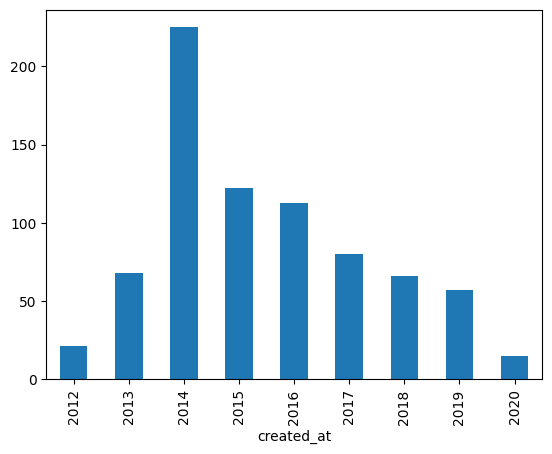

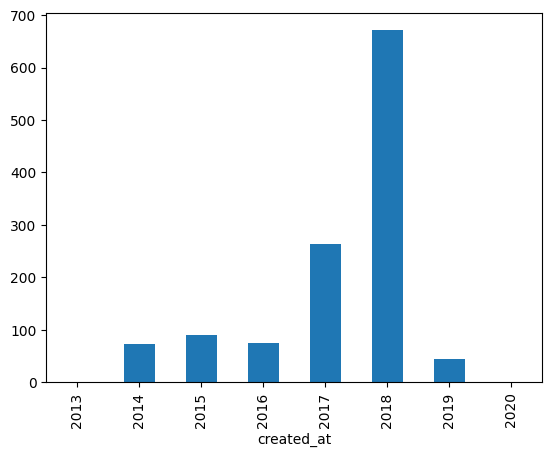

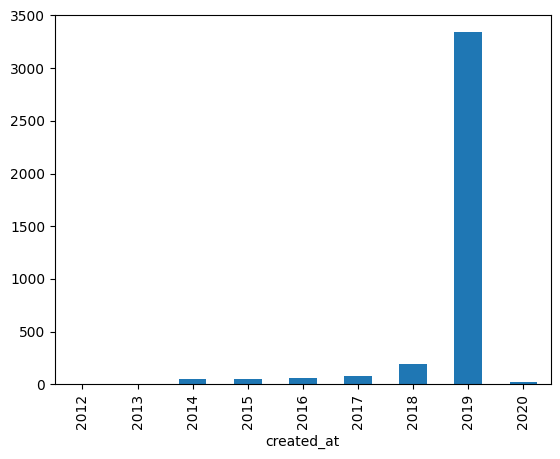

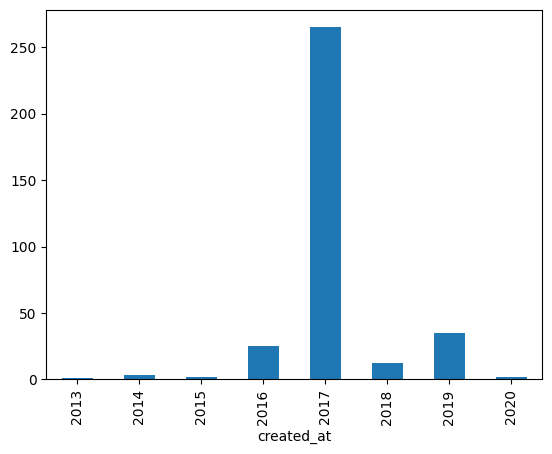

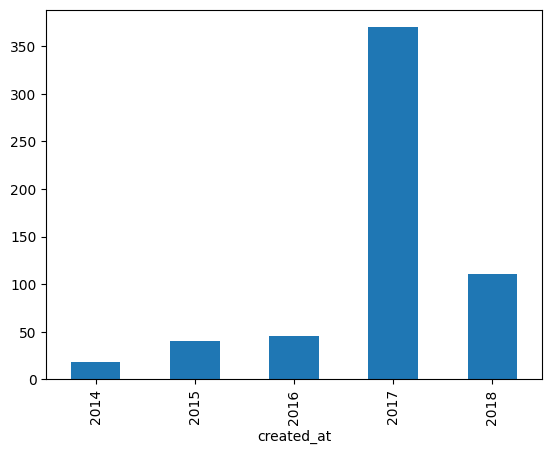

...

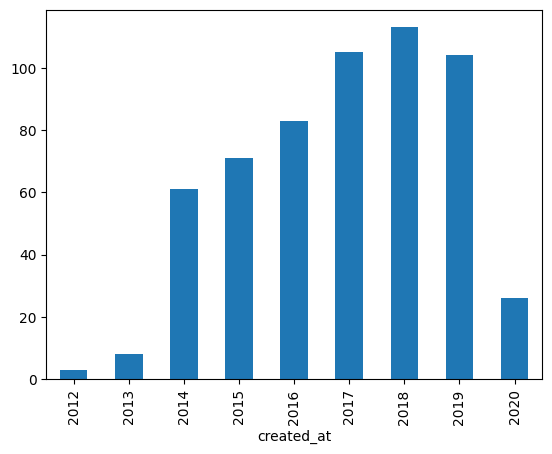

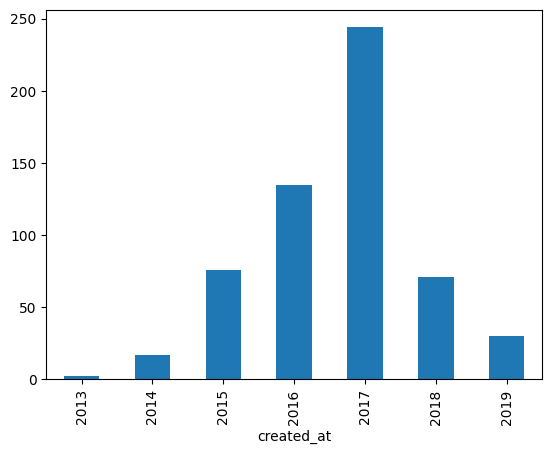

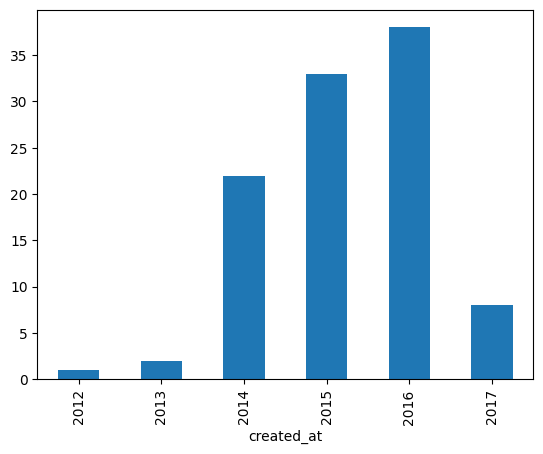

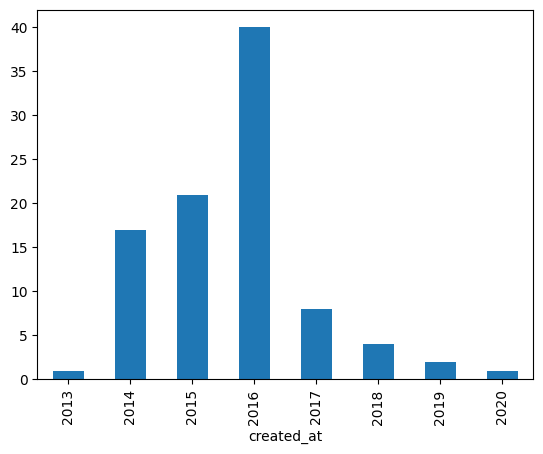

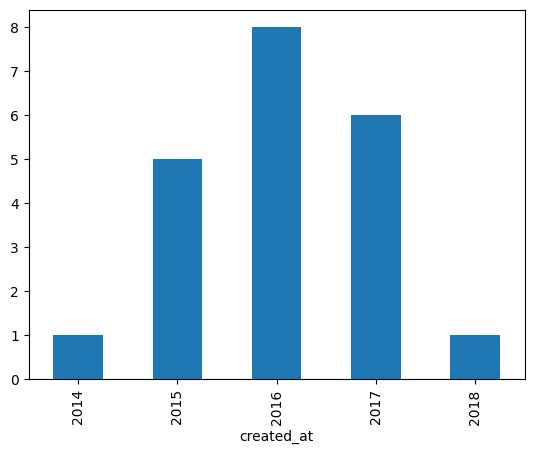

In [20]:
plot_date_feature_clusters(df, kmeans, selected_k)

## Distribution of Numerical Features per Cluster

In [21]:
def plot_numerical_features_clusters(df, cluster_model, num_cluster):
    """
    print and plot distribution of numerical features conditioned by the cluster
    """
    
    for i in range(num_cluster):
        i_samples = cluster_model.labels_==i
        df[i_samples].boxplot()
        df[i_samples].hist()
        plt.show()

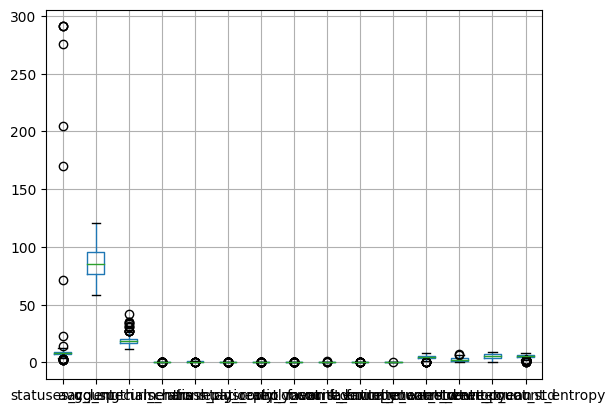

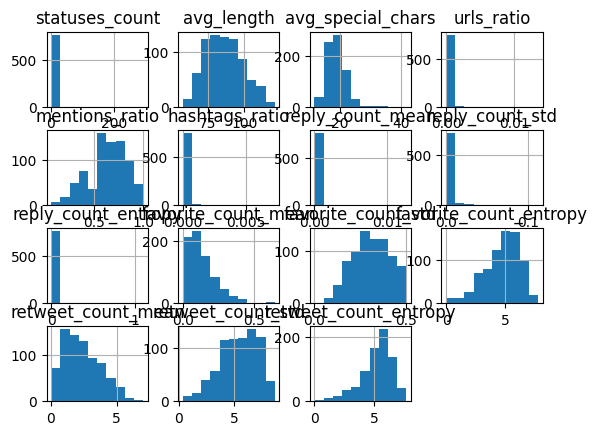

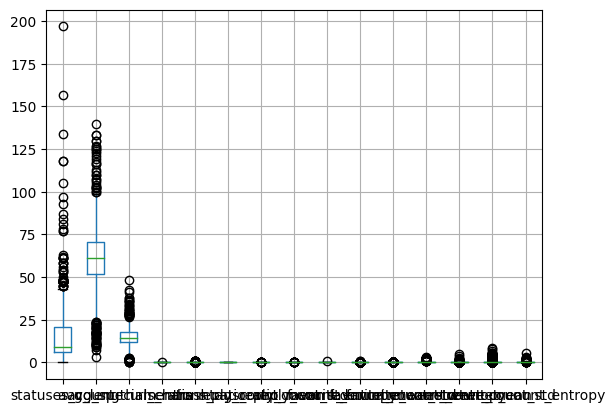

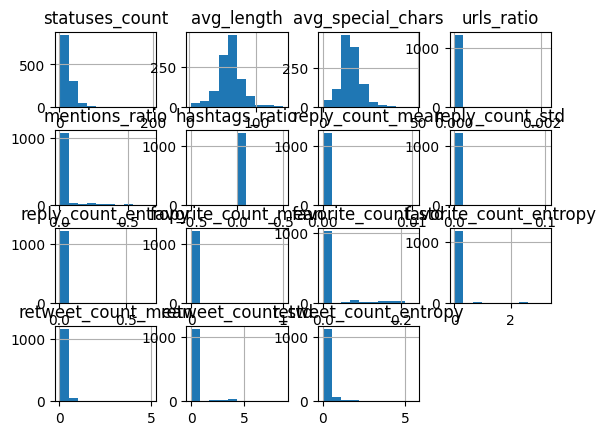

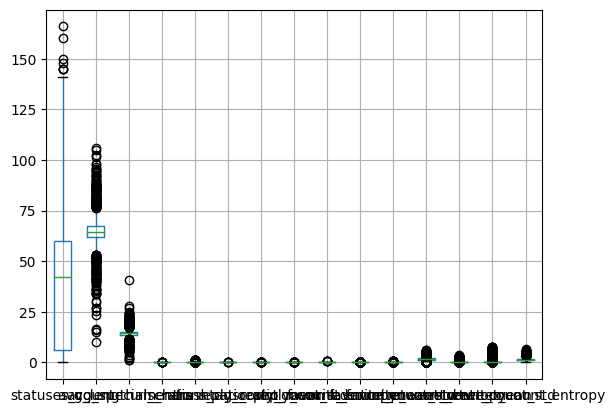

...

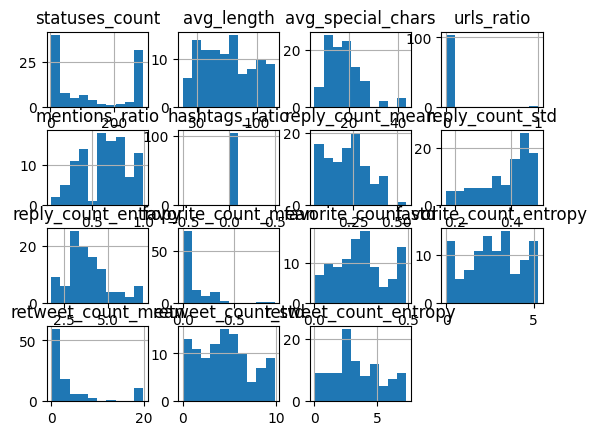

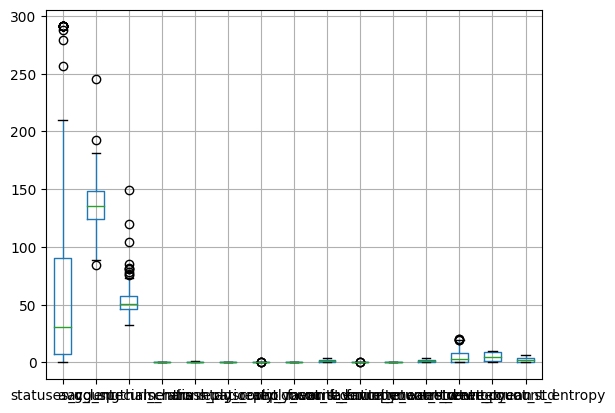

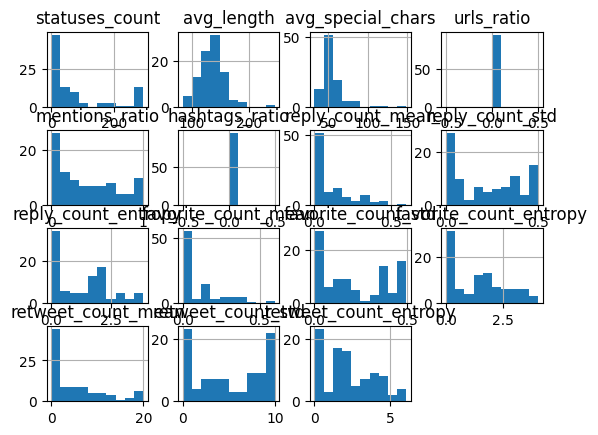

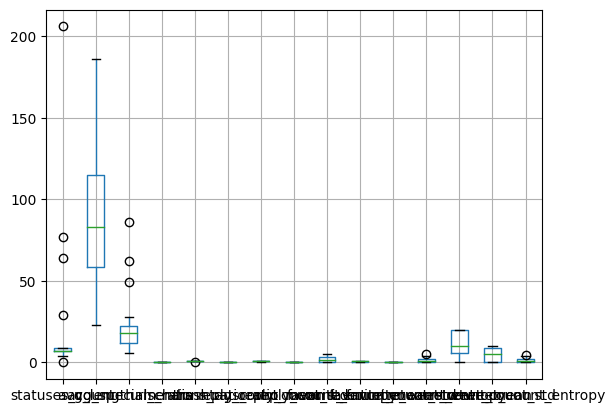

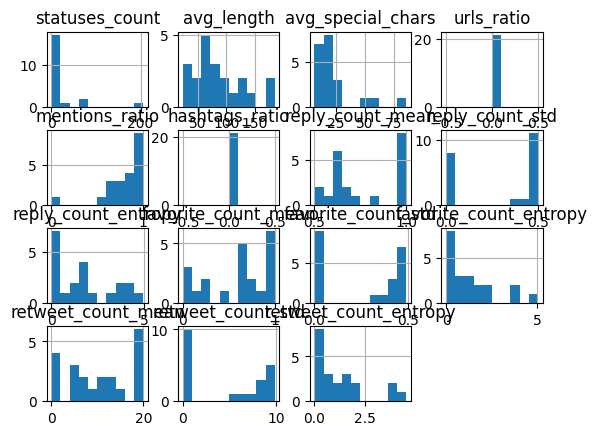

In [22]:
plot_numerical_features_clusters(df_num, kmeans, selected_k)

In [23]:
def scatter_features_clusters(df, cluster_model):
    for i in range(len(df.columns)):
        for j in range(i+1, len(df.columns)):
            feature_1 = df.columns[i]
            feature_2 = df.columns[j]
            
            print(f"{feature_1} - {feature_2}")
            plt.scatter(df[feature_1], df[feature_2], c=kmeans.labels_, s=20)
            plt.tick_params(axis='both', which='major', labelsize=22)
            plt.show()

statuses_count - avg_length


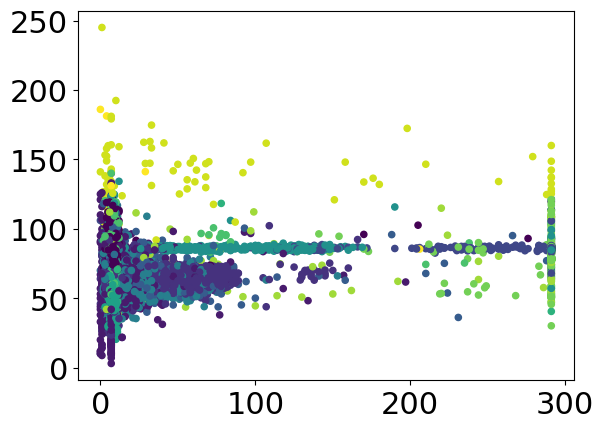

statuses_count - avg_special_chars


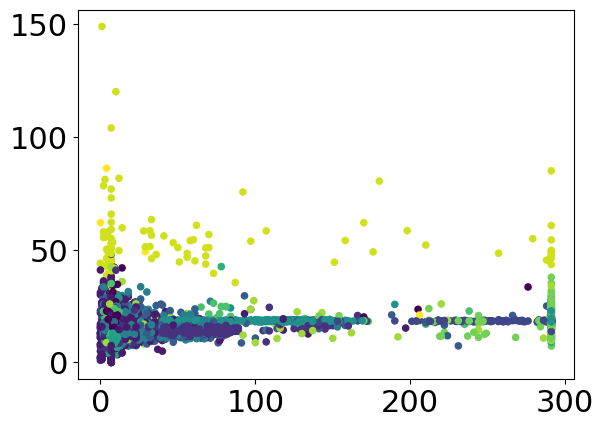

statuses_count - urls_ratio


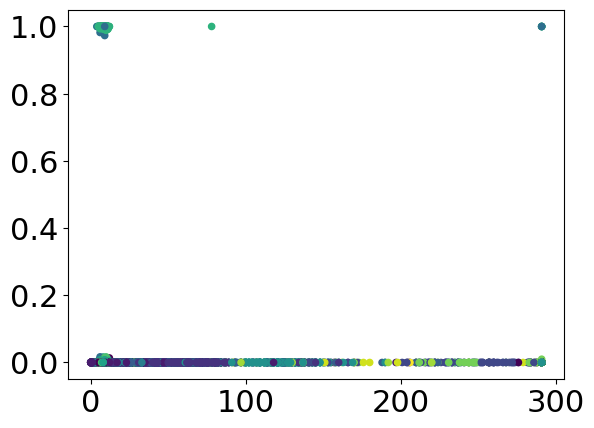

statuses_count - mentions_ratio


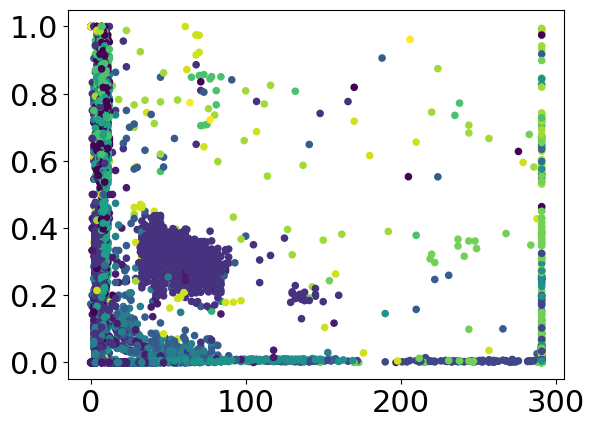

statuses_count - hashtags_ratio


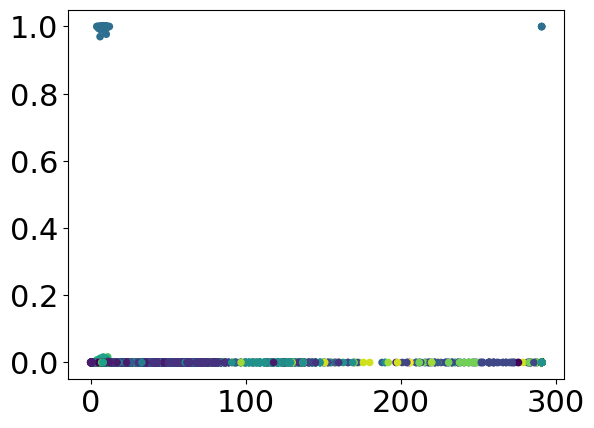

statuses_count - reply_count_mean


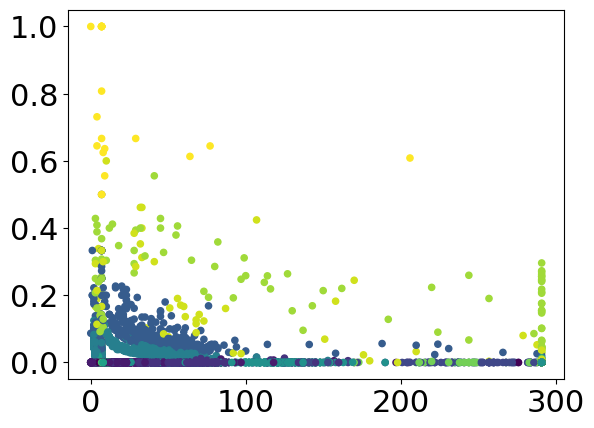

statuses_count - reply_count_std


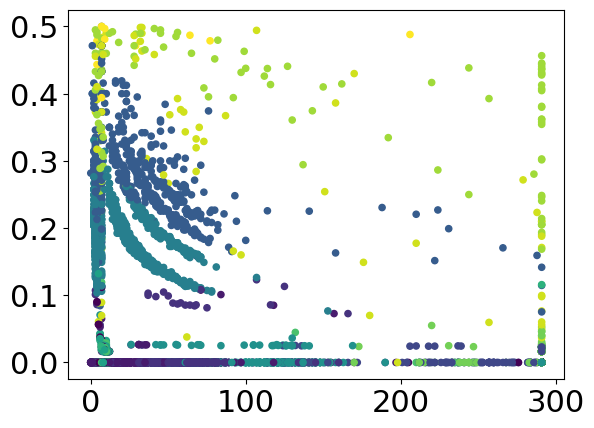

statuses_count - reply_count_entropy


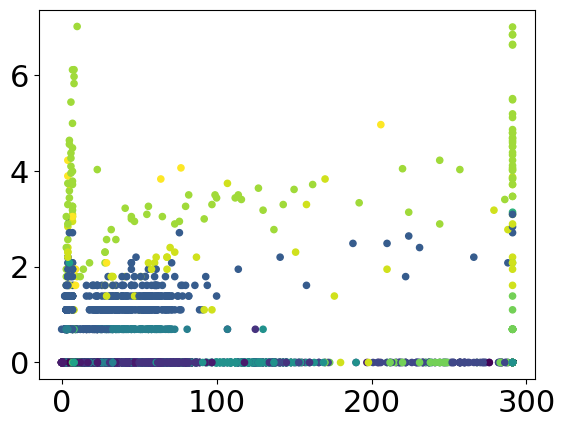

statuses_count - favorite_count_mean


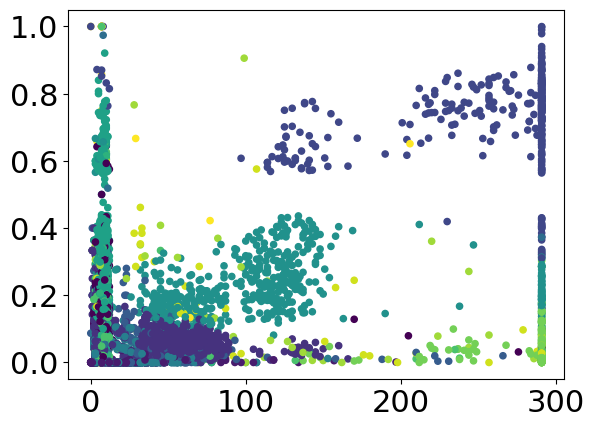

statuses_count - favorite_count_std


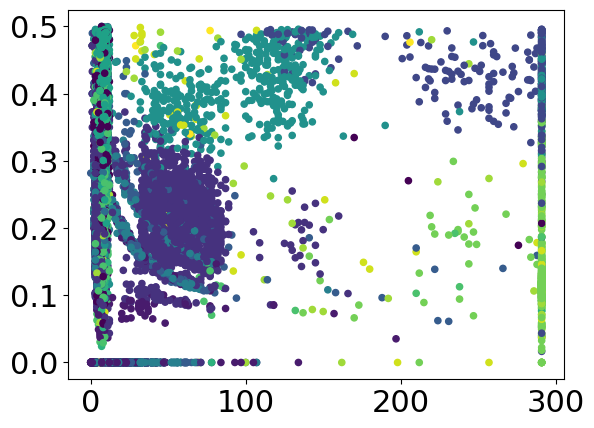

statuses_count - favorite_count_entropy


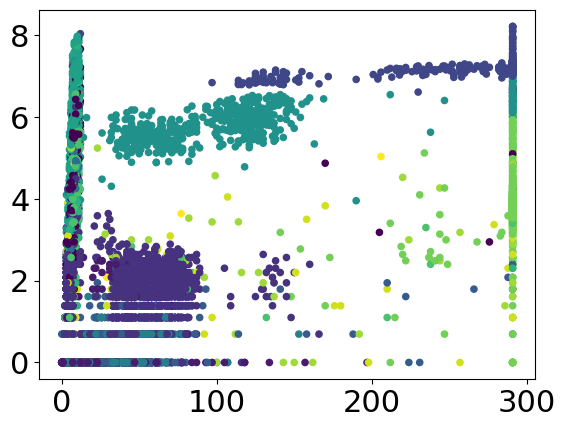

statuses_count - retweet_count_mean


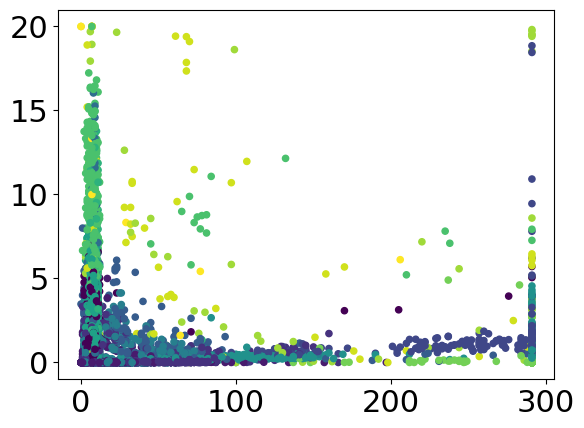

statuses_count - retweet_count_std


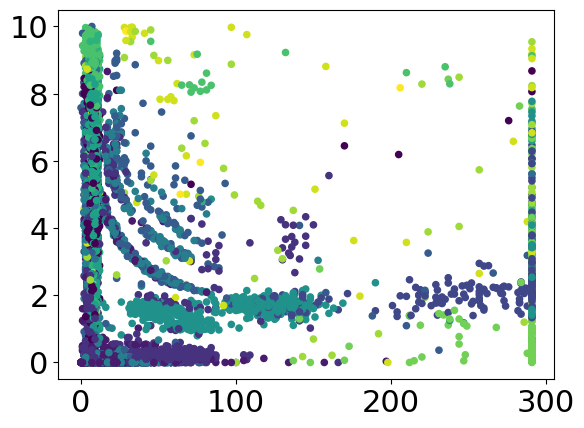

statuses_count - retweet_count_entropy


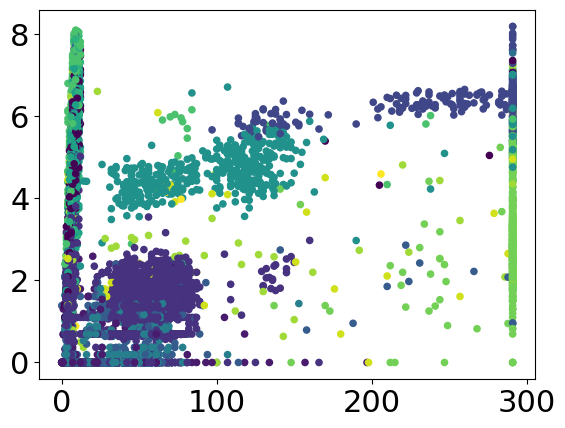

avg_length - avg_special_chars


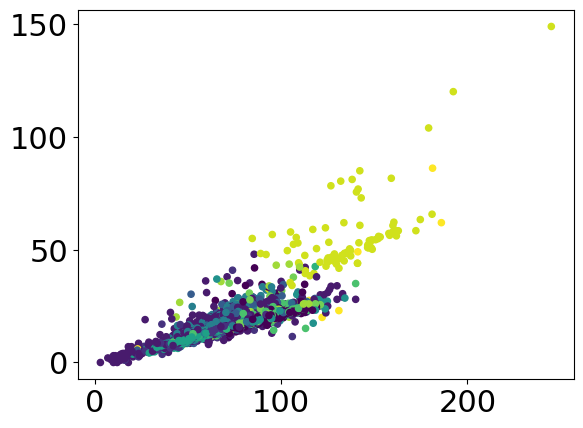

avg_length - urls_ratio


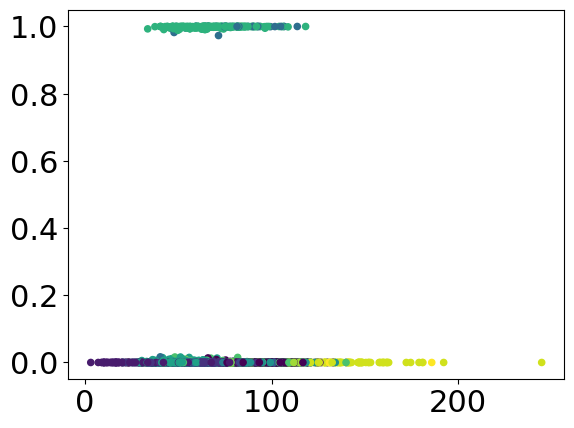

avg_length - mentions_ratio


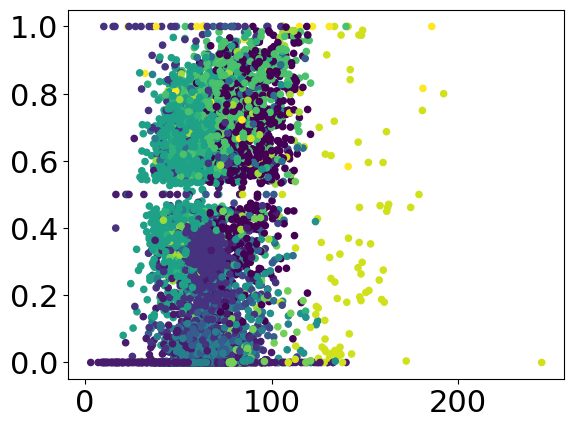

avg_length - hashtags_ratio


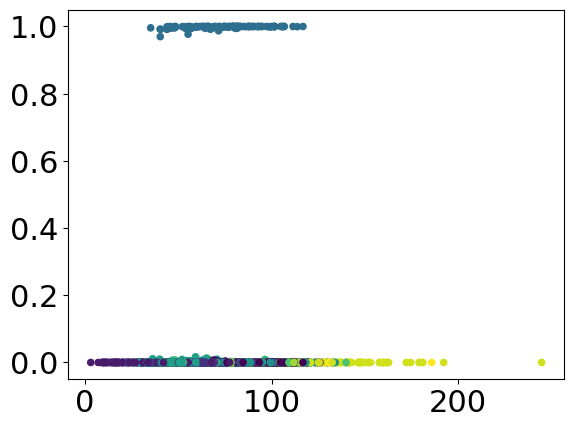

avg_length - reply_count_mean


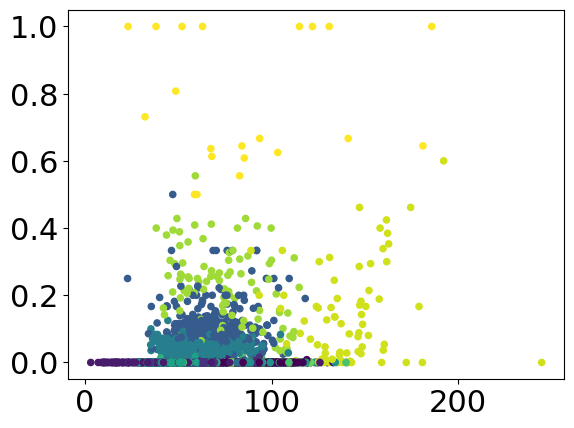

avg_length - reply_count_std


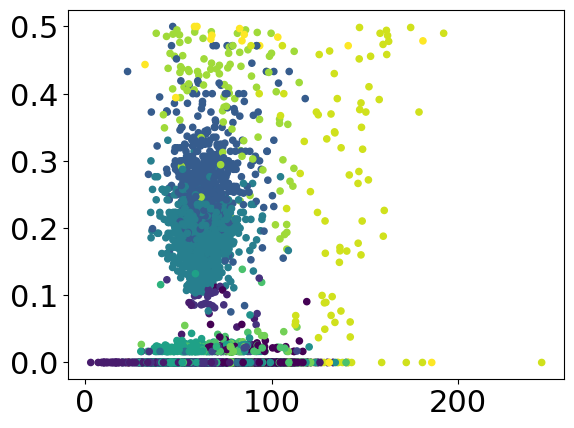

avg_length - reply_count_entropy


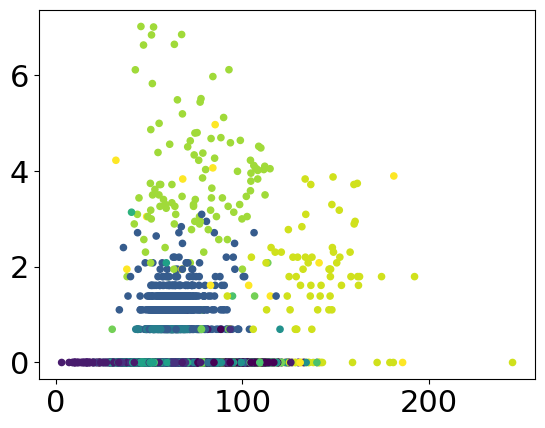

avg_length - favorite_count_mean


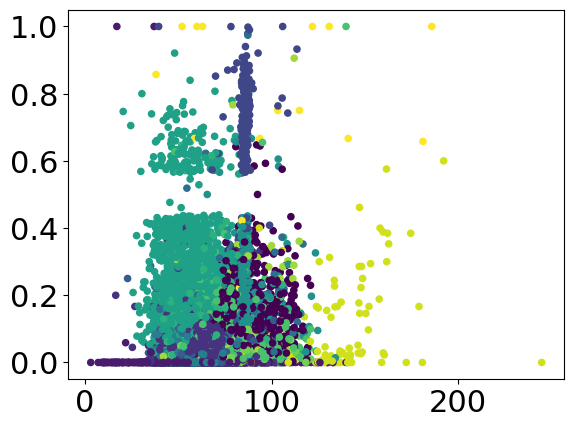

avg_length - favorite_count_std


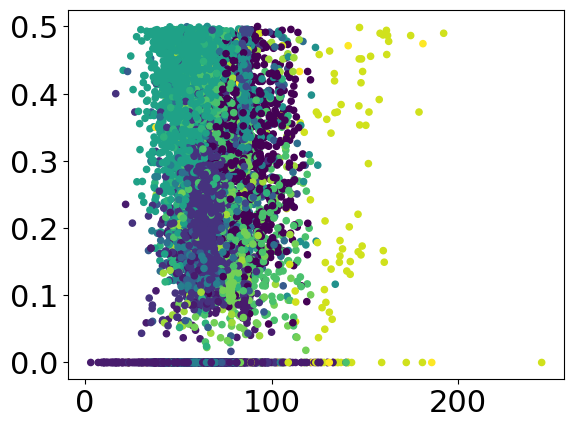

avg_length - favorite_count_entropy


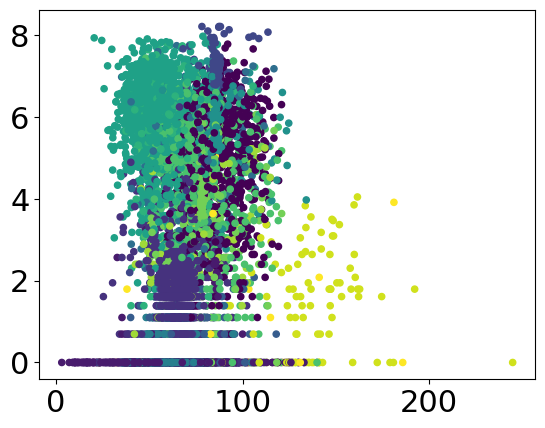

avg_length - retweet_count_mean


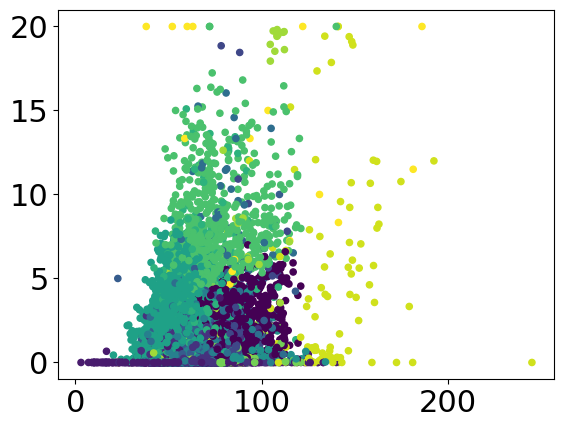

avg_length - retweet_count_std


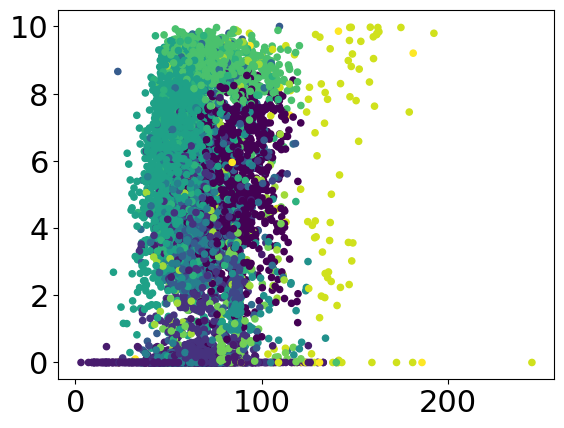

avg_length - retweet_count_entropy


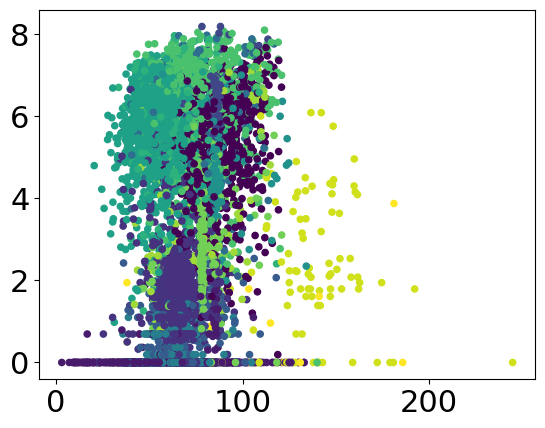

avg_special_chars - urls_ratio


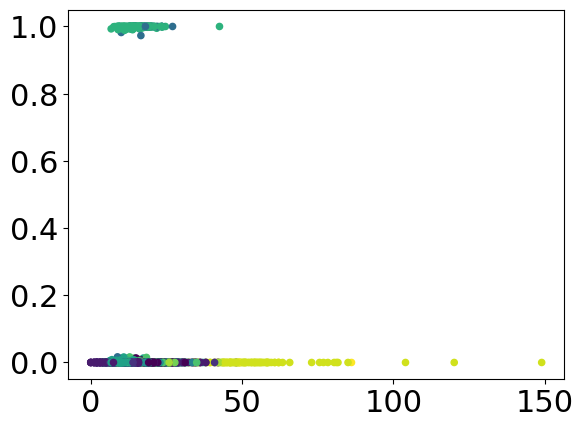

avg_special_chars - mentions_ratio


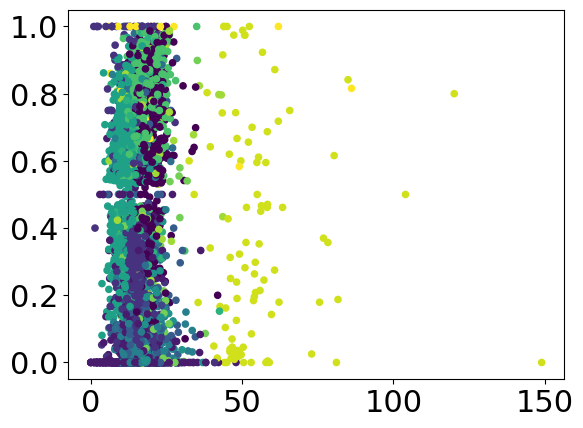

avg_special_chars - hashtags_ratio


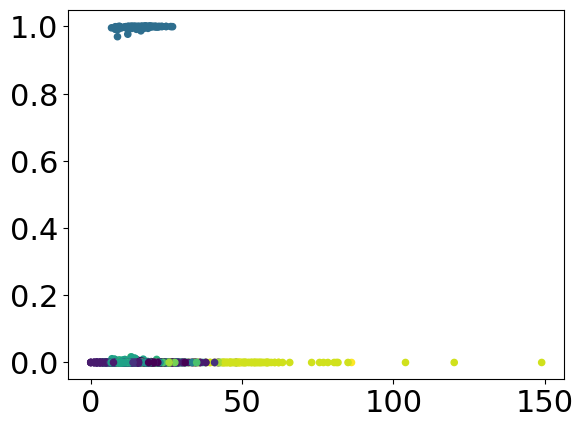

avg_special_chars - reply_count_mean


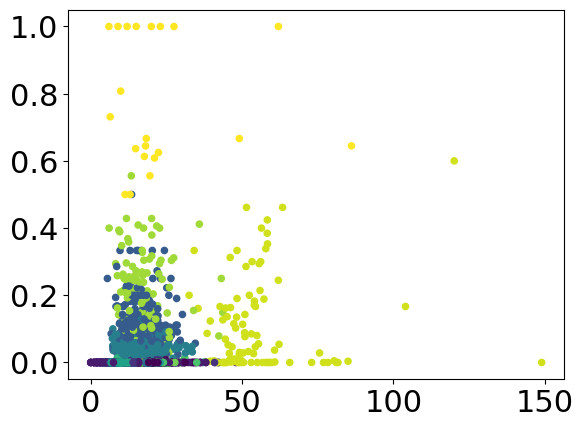

avg_special_chars - reply_count_std


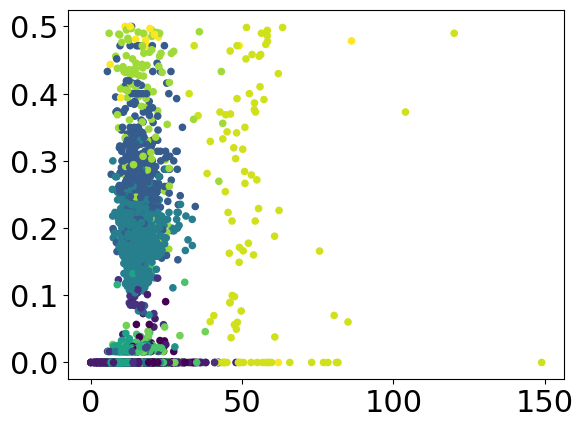

avg_special_chars - reply_count_entropy


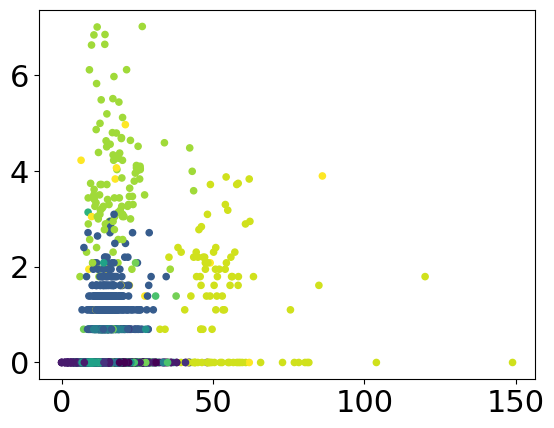

avg_special_chars - favorite_count_mean


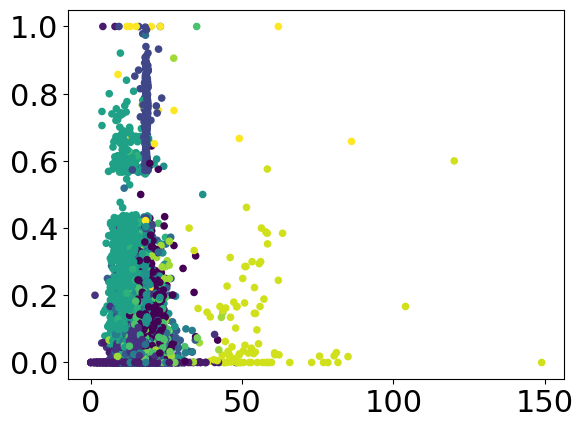

avg_special_chars - favorite_count_std


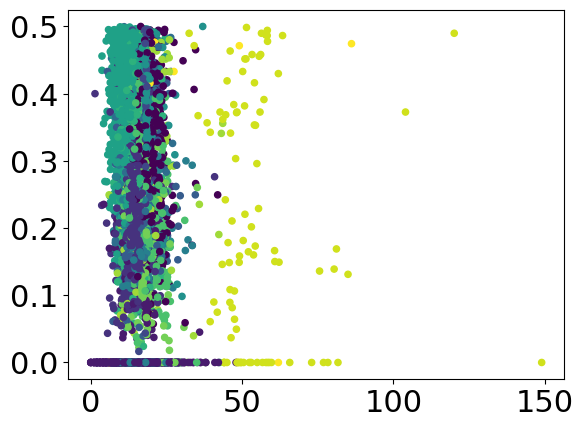

avg_special_chars - favorite_count_entropy


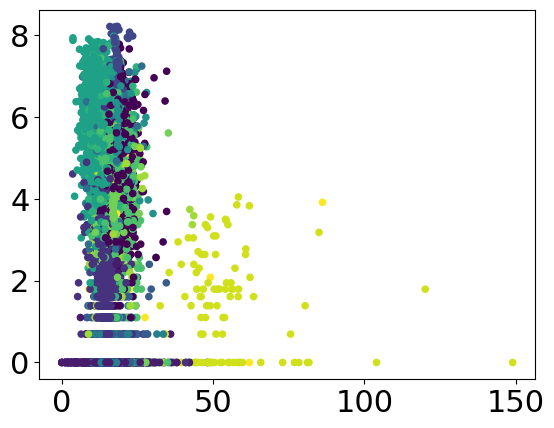

avg_special_chars - retweet_count_mean


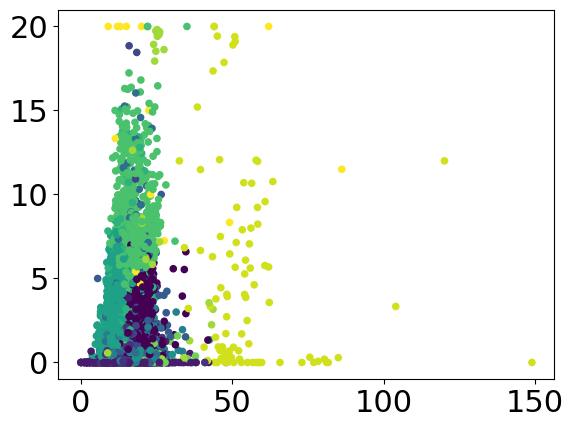

avg_special_chars - retweet_count_std


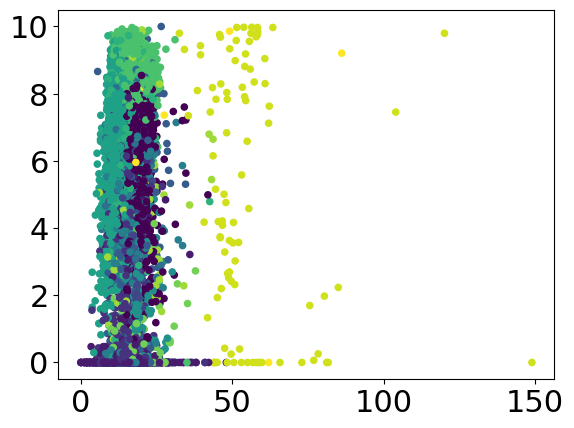

avg_special_chars - retweet_count_entropy


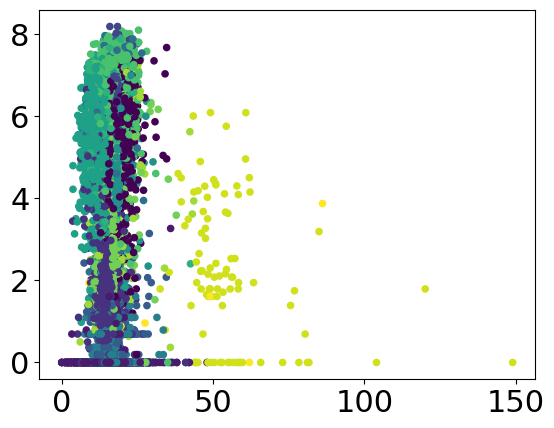

urls_ratio - mentions_ratio


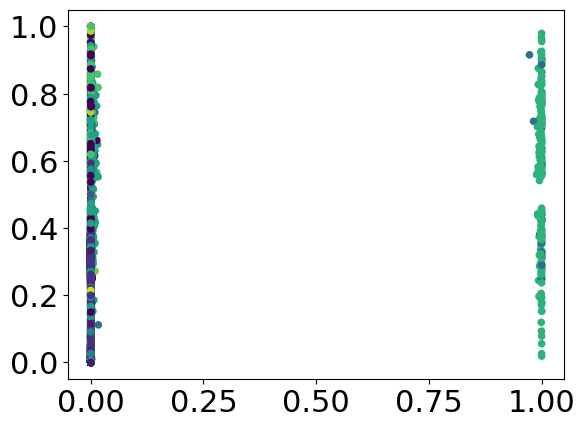

urls_ratio - hashtags_ratio


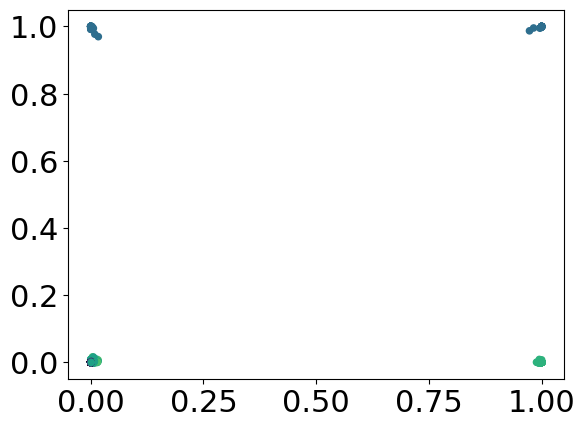

urls_ratio - reply_count_mean


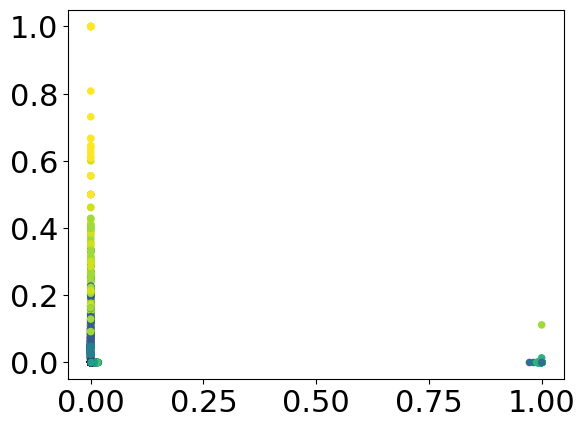

urls_ratio - reply_count_std


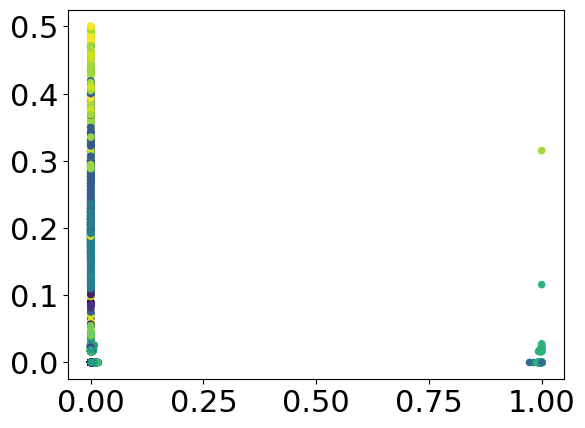

urls_ratio - reply_count_entropy


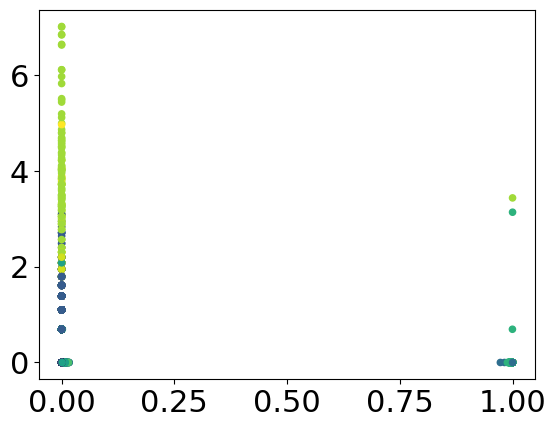

urls_ratio - favorite_count_mean


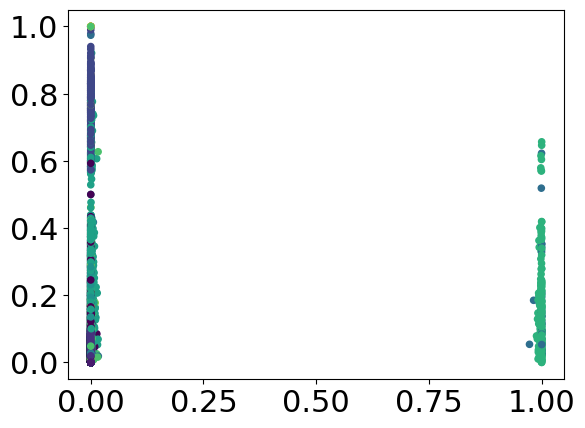

urls_ratio - favorite_count_std


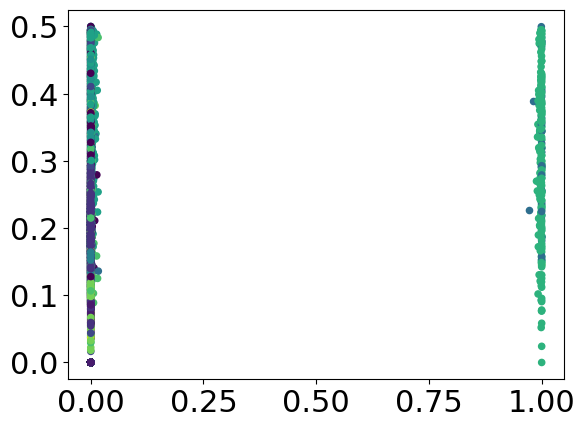

urls_ratio - favorite_count_entropy


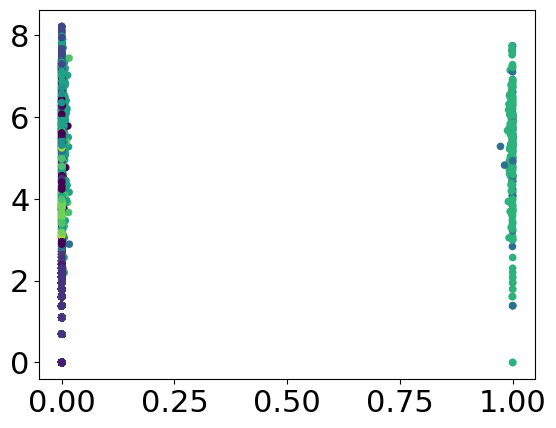

urls_ratio - retweet_count_mean


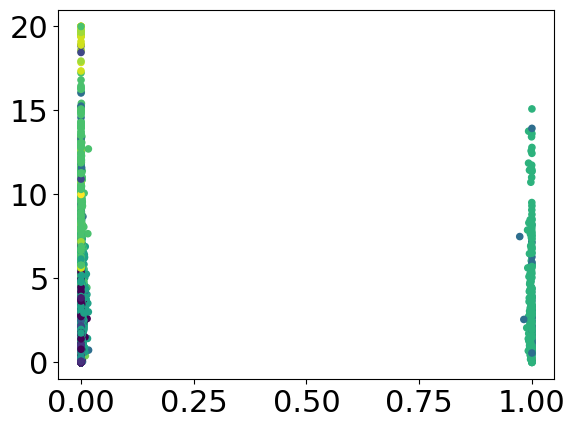

urls_ratio - retweet_count_std


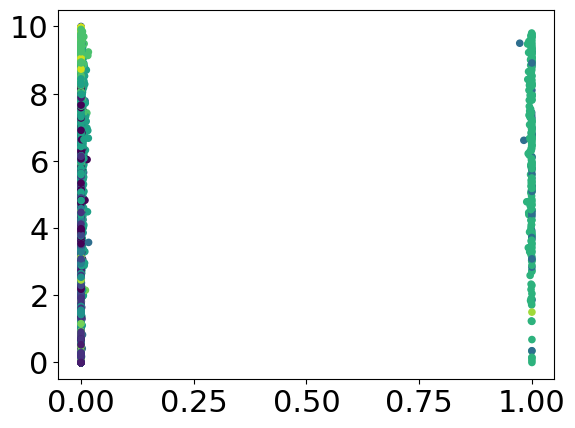

urls_ratio - retweet_count_entropy


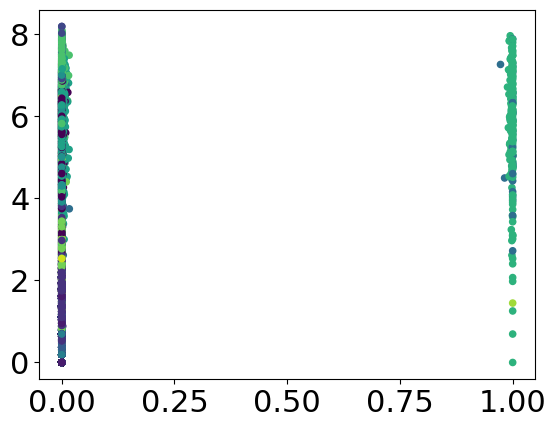

mentions_ratio - hashtags_ratio


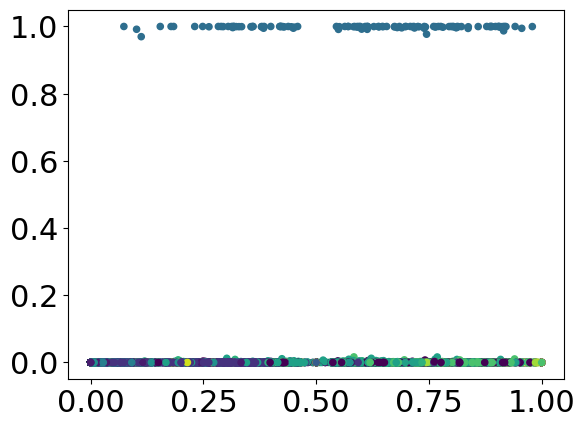

mentions_ratio - reply_count_mean


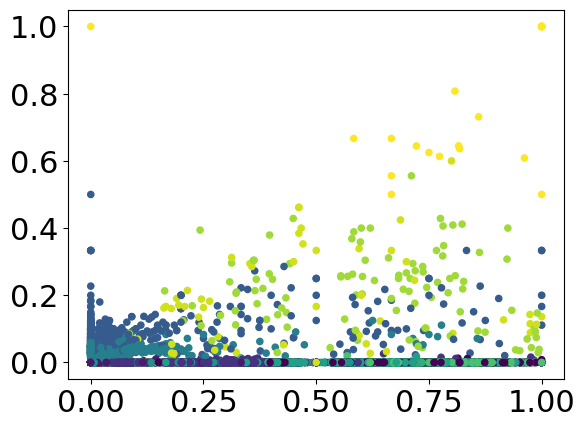

mentions_ratio - reply_count_std


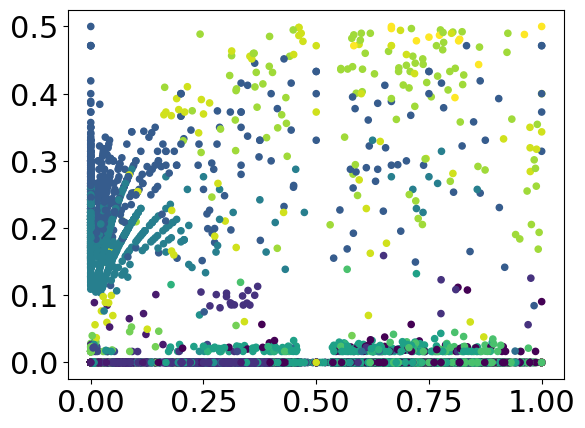

mentions_ratio - reply_count_entropy


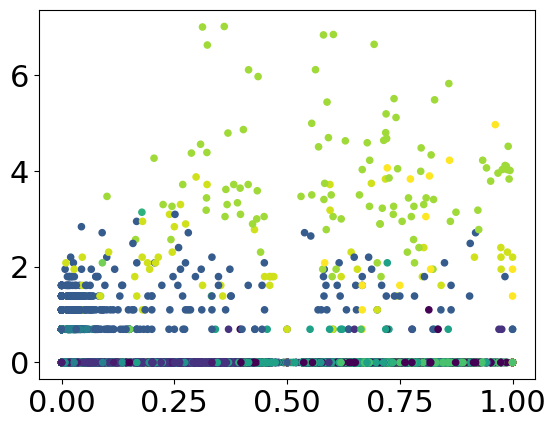

mentions_ratio - favorite_count_mean


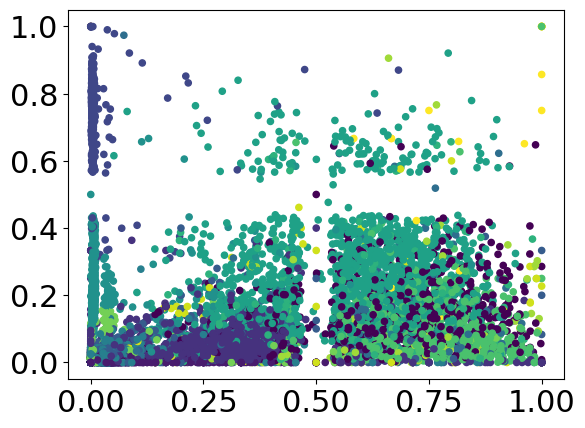

mentions_ratio - favorite_count_std


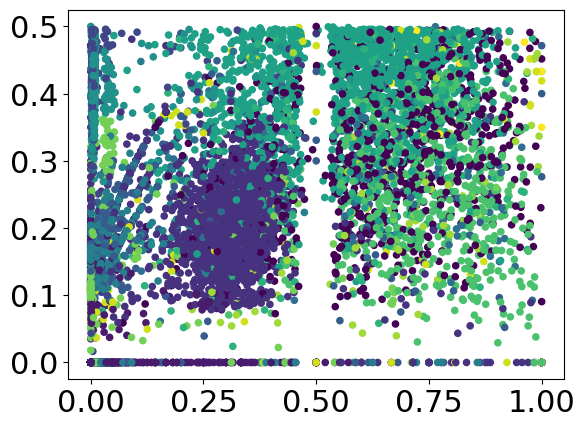

mentions_ratio - favorite_count_entropy


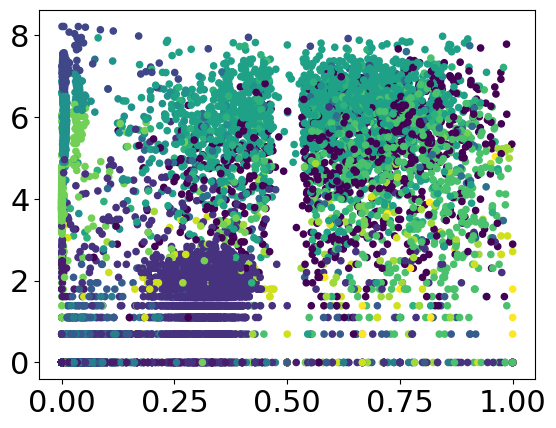

mentions_ratio - retweet_count_mean


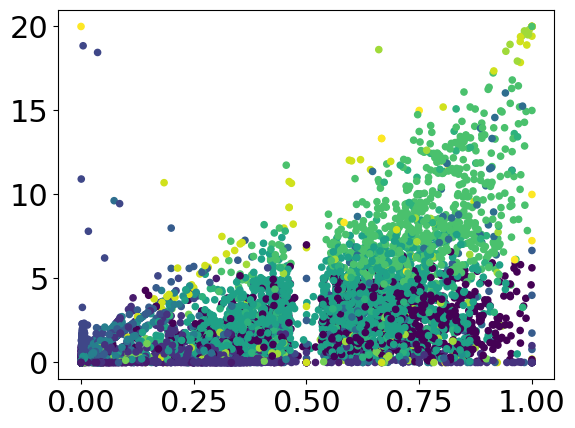

mentions_ratio - retweet_count_std


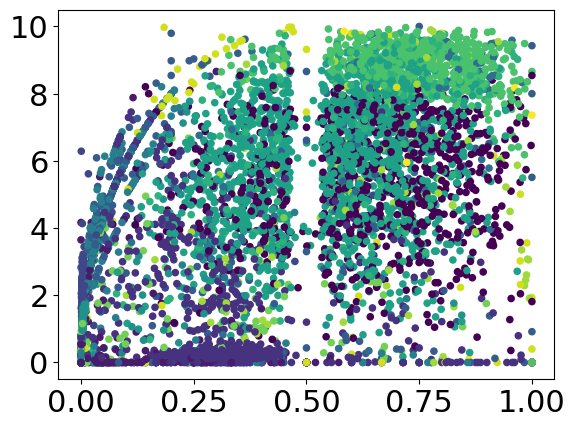

mentions_ratio - retweet_count_entropy


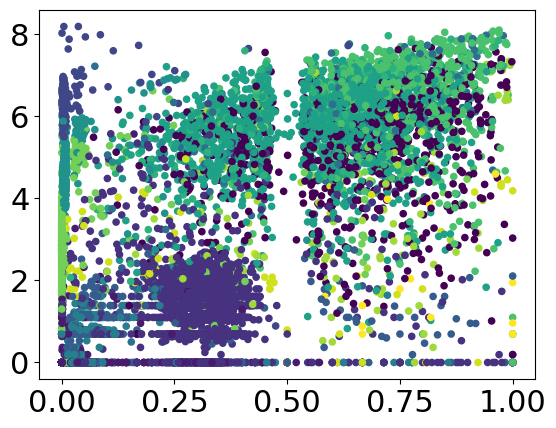

hashtags_ratio - reply_count_mean


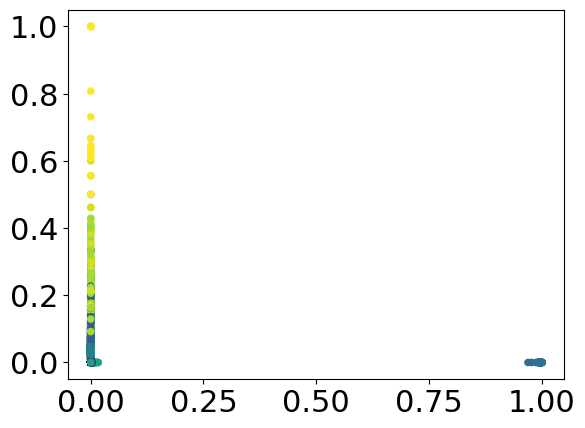

hashtags_ratio - reply_count_std


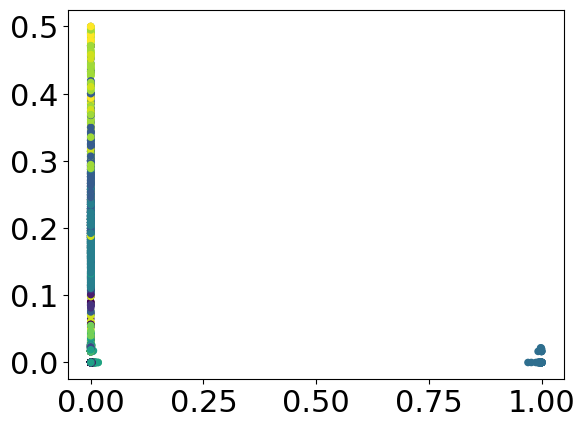

hashtags_ratio - reply_count_entropy


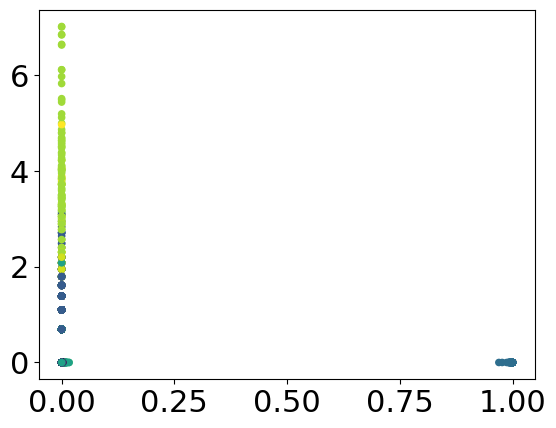

hashtags_ratio - favorite_count_mean


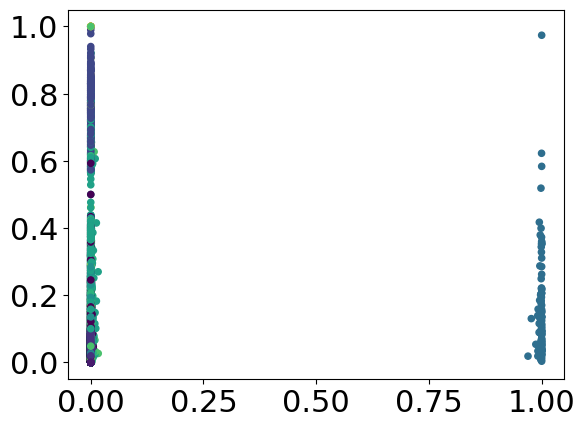

hashtags_ratio - favorite_count_std


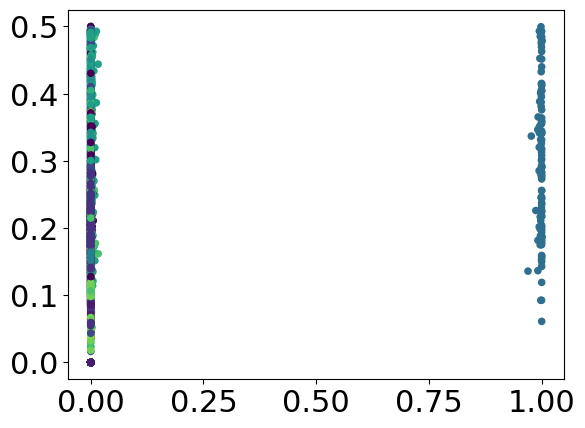

hashtags_ratio - favorite_count_entropy


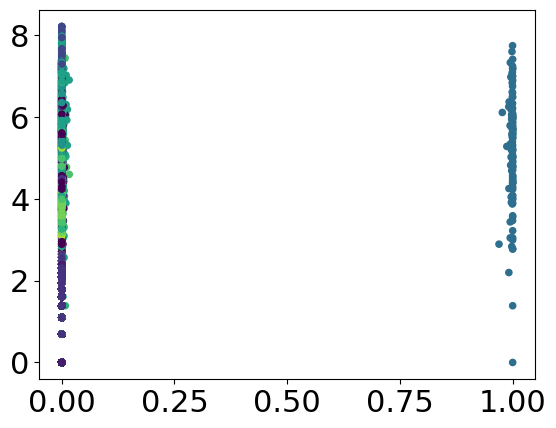

hashtags_ratio - retweet_count_mean


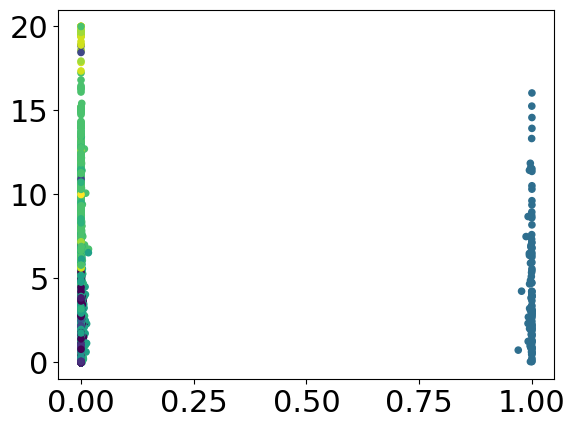

hashtags_ratio - retweet_count_std


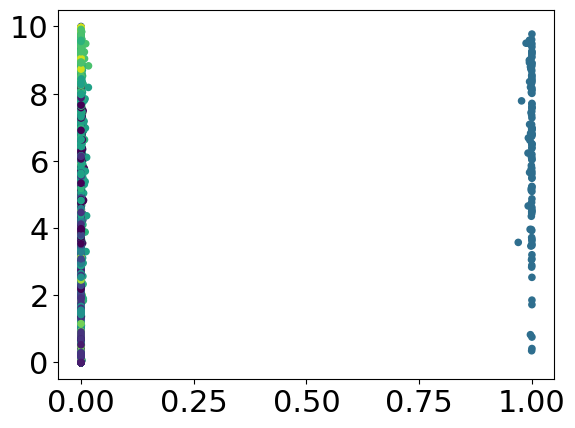

hashtags_ratio - retweet_count_entropy


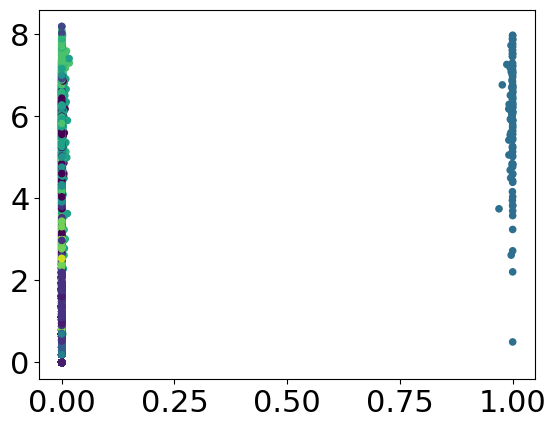

reply_count_mean - reply_count_std


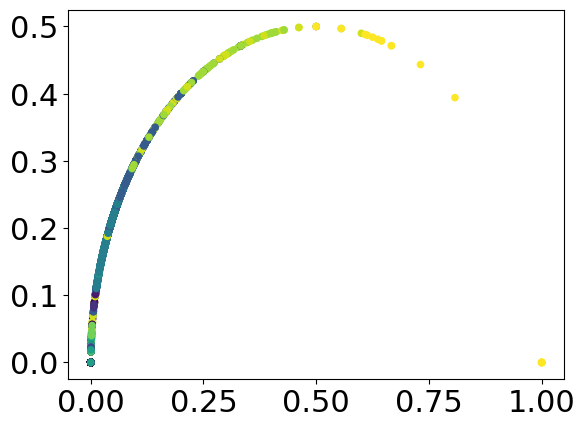

reply_count_mean - reply_count_entropy


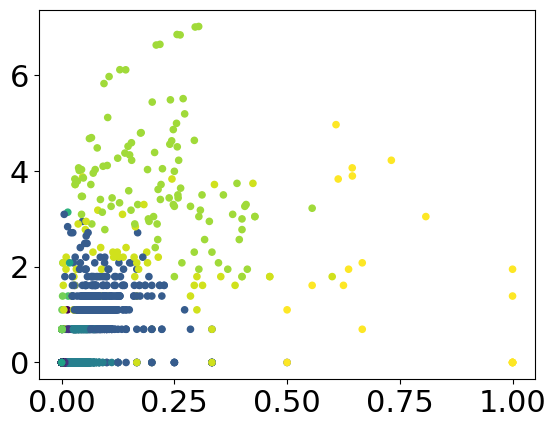

reply_count_mean - favorite_count_mean


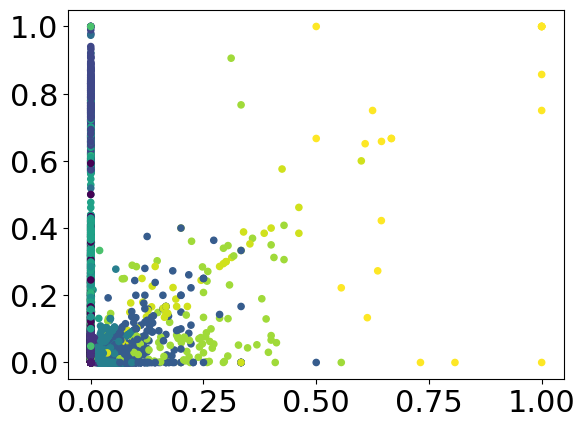

reply_count_mean - favorite_count_std


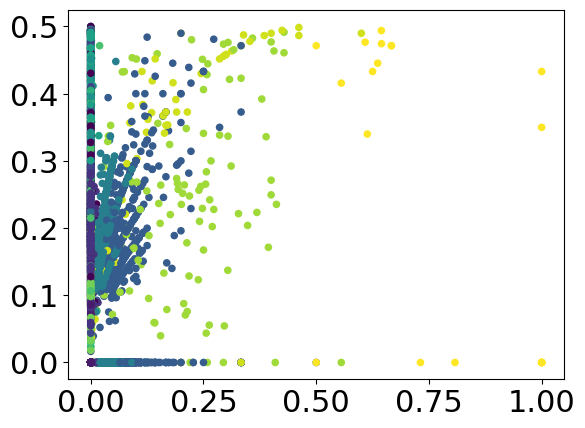

reply_count_mean - favorite_count_entropy


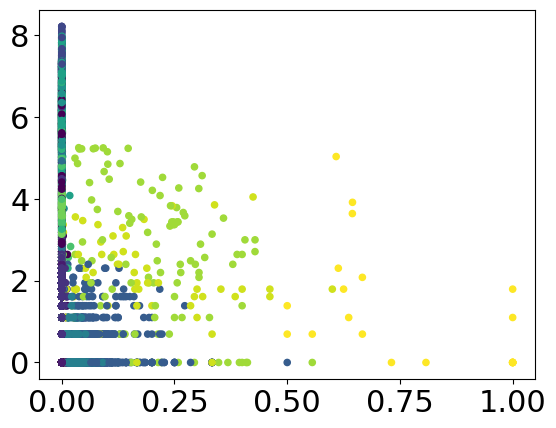

reply_count_mean - retweet_count_mean


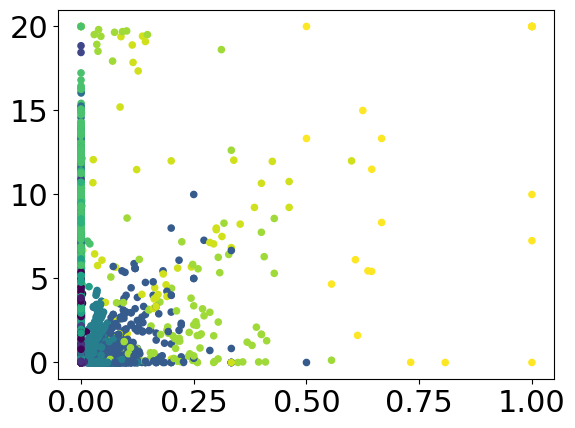

reply_count_mean - retweet_count_std


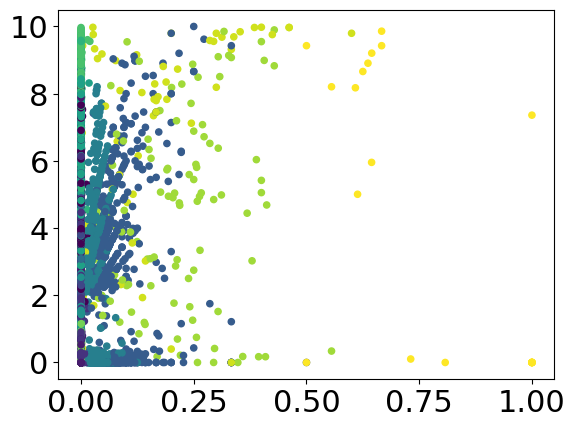

reply_count_mean - retweet_count_entropy


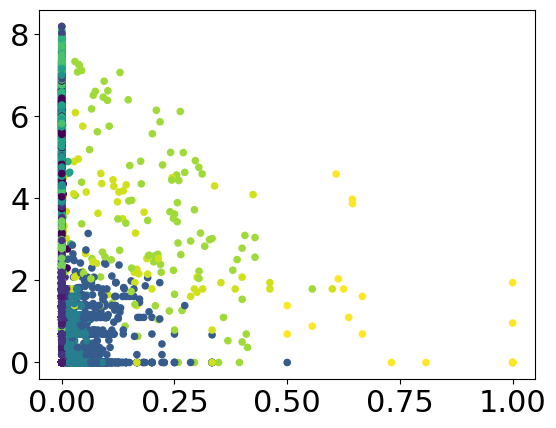

reply_count_std - reply_count_entropy


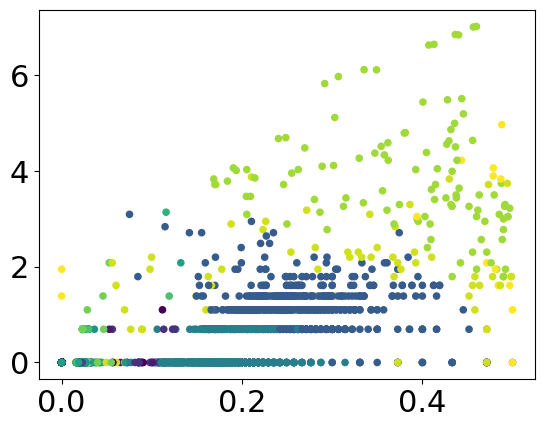

reply_count_std - favorite_count_mean


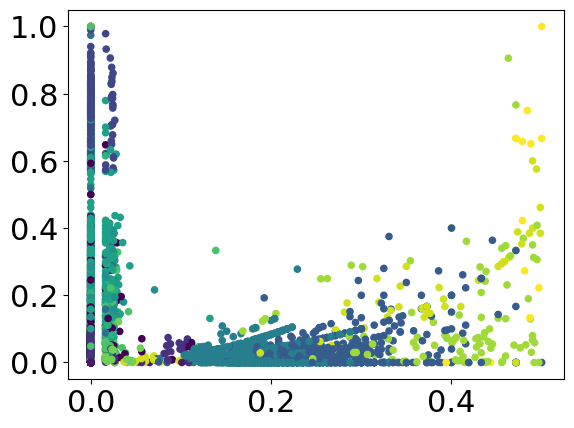

reply_count_std - favorite_count_std


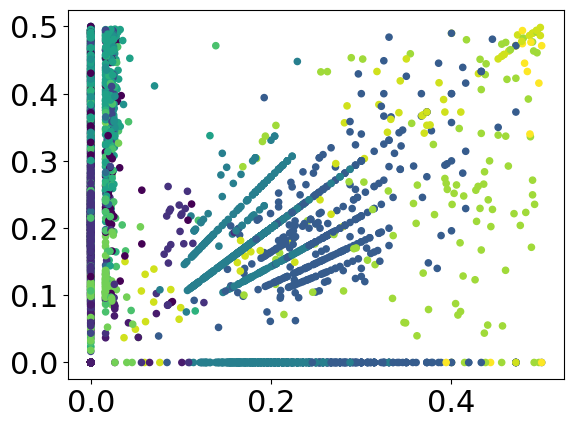

reply_count_std - favorite_count_entropy


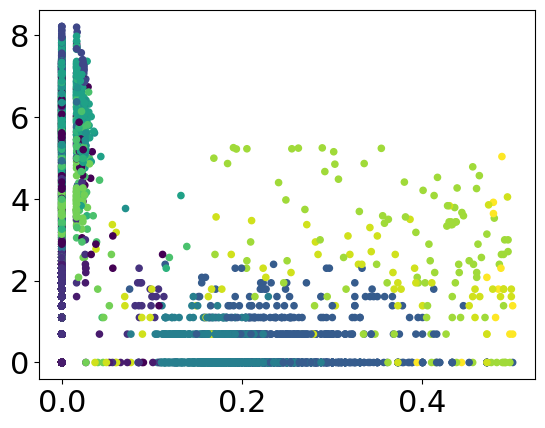

reply_count_std - retweet_count_mean


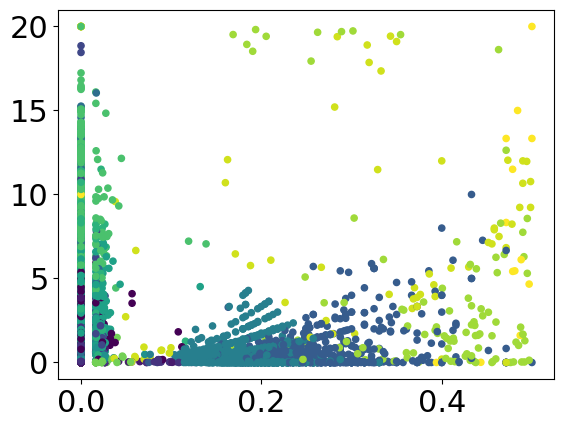

reply_count_std - retweet_count_std


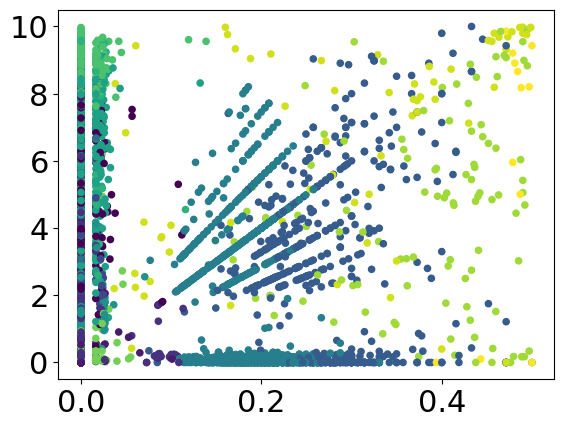

reply_count_std - retweet_count_entropy


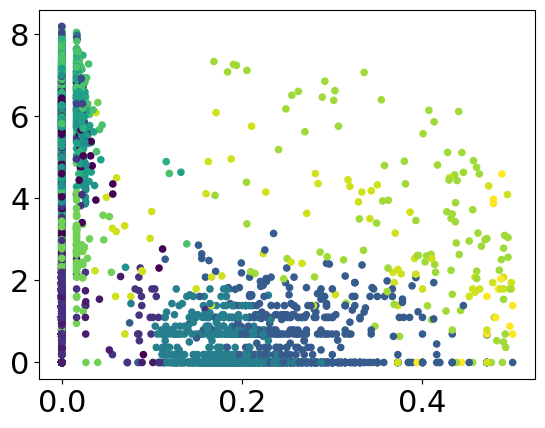

reply_count_entropy - favorite_count_mean


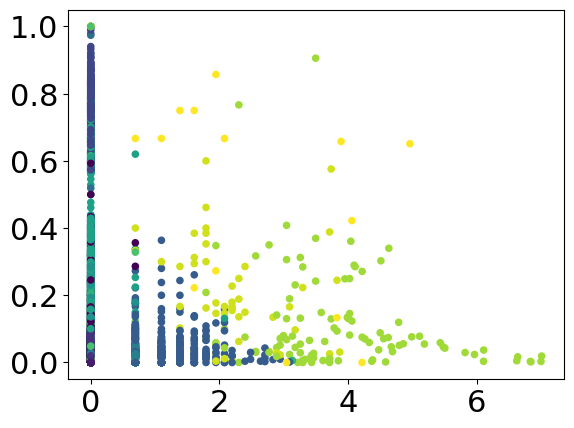

reply_count_entropy - favorite_count_std


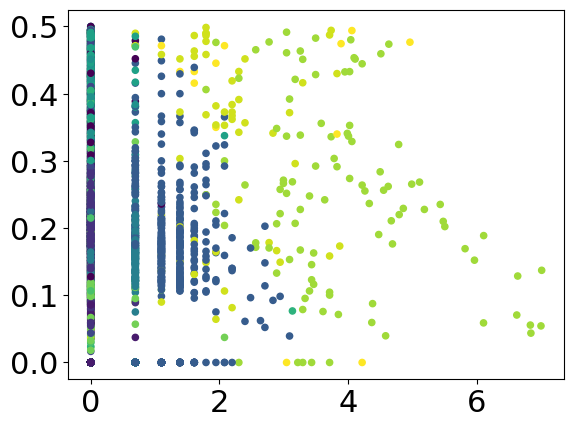

reply_count_entropy - favorite_count_entropy


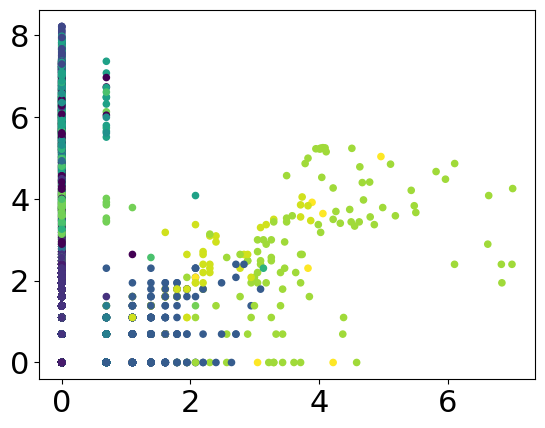

reply_count_entropy - retweet_count_mean


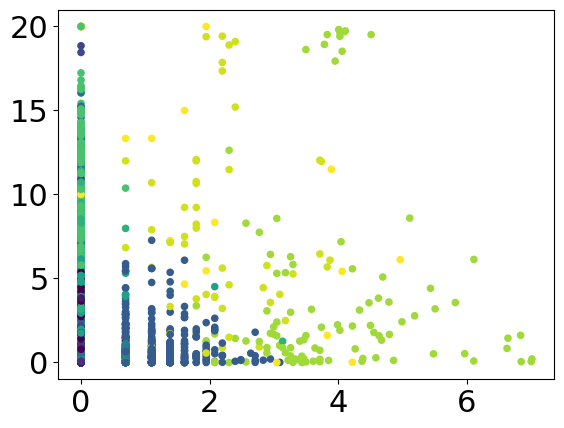

reply_count_entropy - retweet_count_std


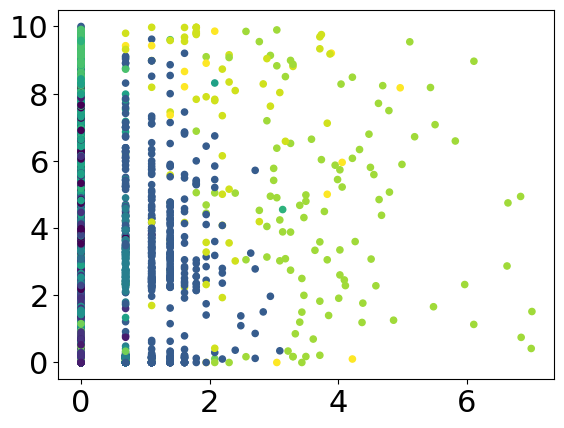

reply_count_entropy - retweet_count_entropy


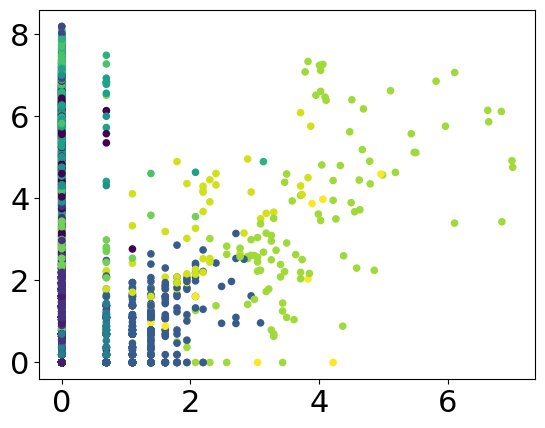

favorite_count_mean - favorite_count_std


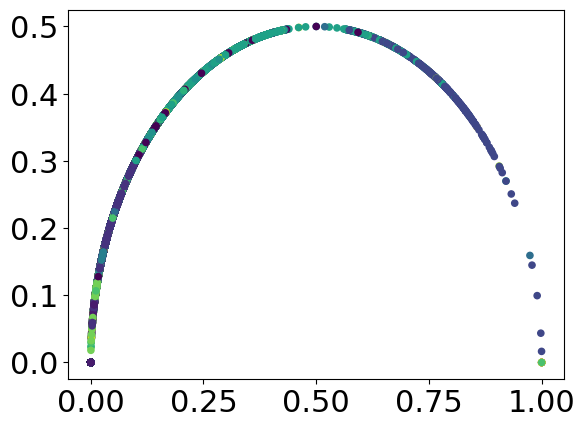

favorite_count_mean - favorite_count_entropy


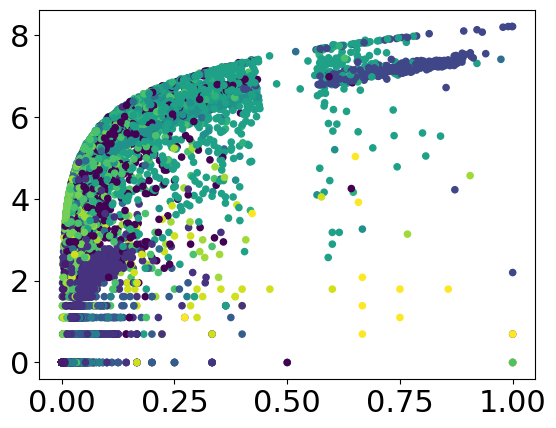

favorite_count_mean - retweet_count_mean


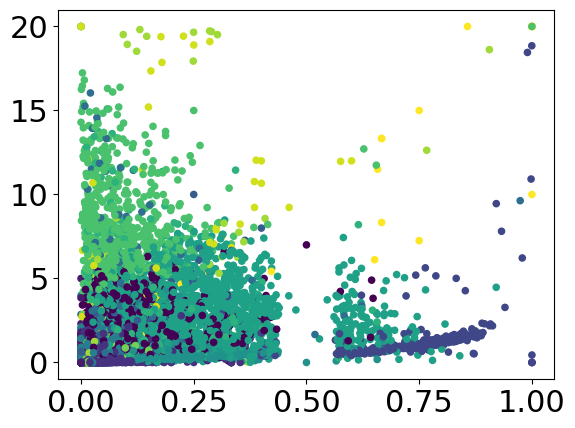

favorite_count_mean - retweet_count_std


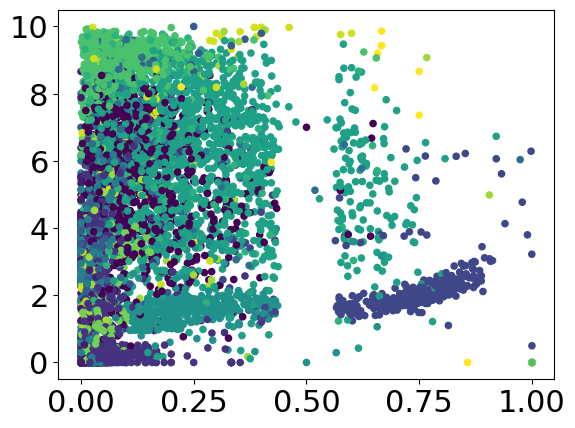

favorite_count_mean - retweet_count_entropy


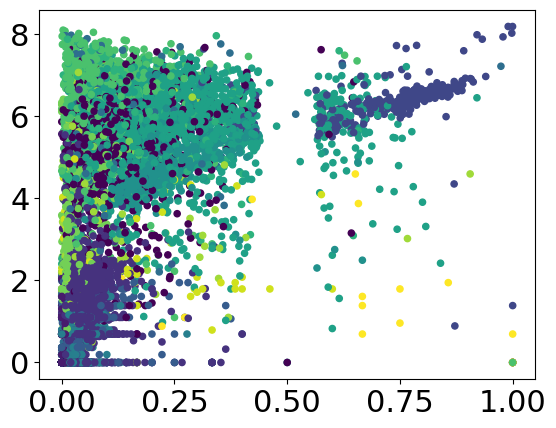

favorite_count_std - favorite_count_entropy


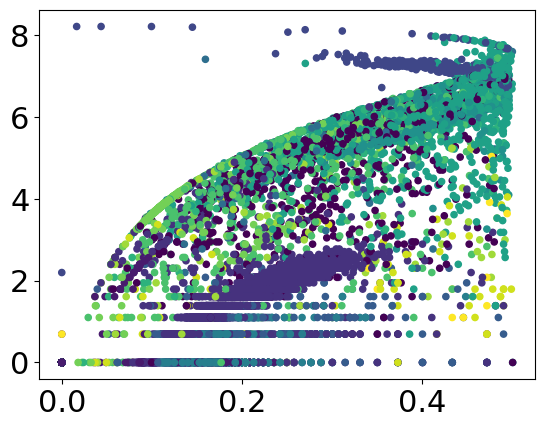

favorite_count_std - retweet_count_mean


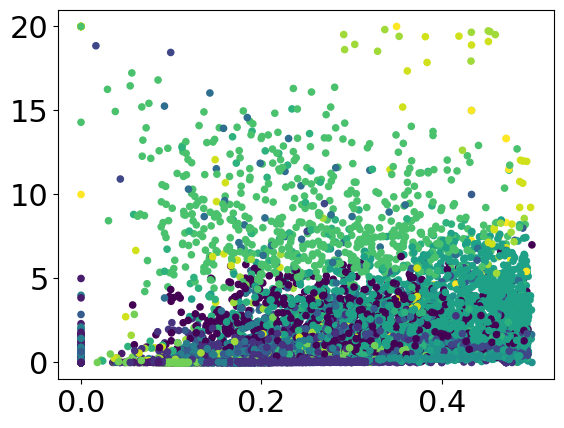

favorite_count_std - retweet_count_std


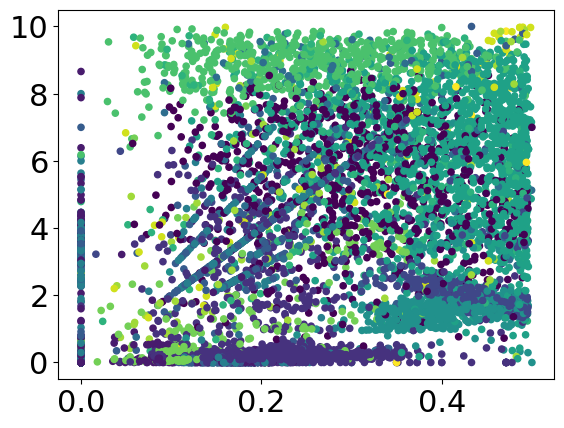

favorite_count_std - retweet_count_entropy


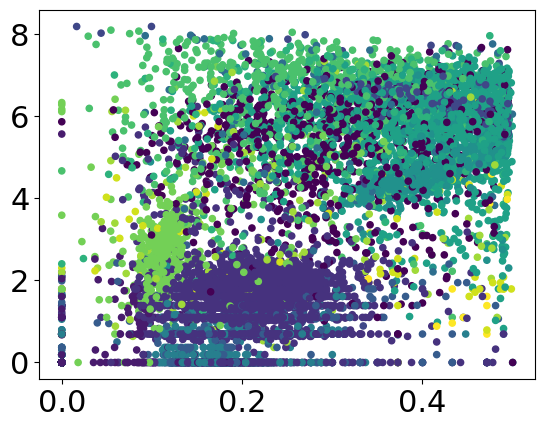

favorite_count_entropy - retweet_count_mean


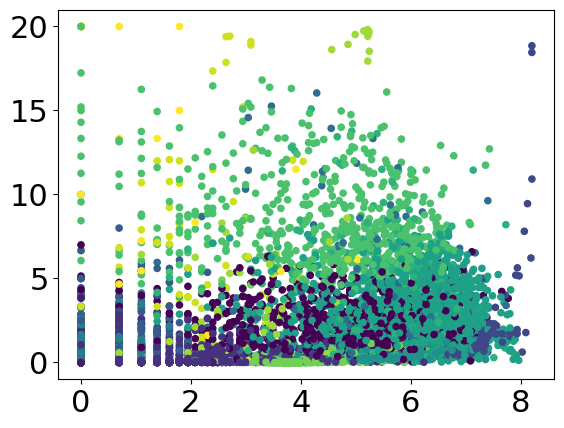

favorite_count_entropy - retweet_count_std


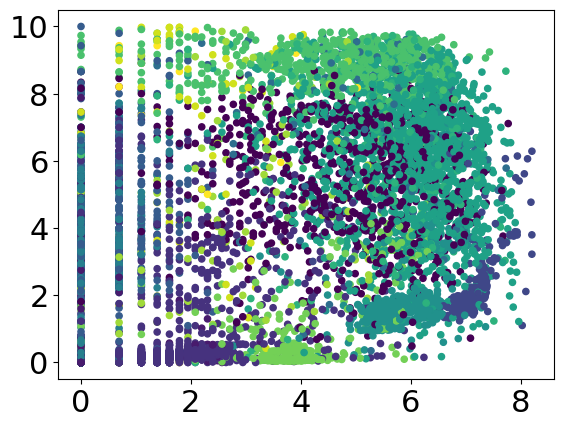

favorite_count_entropy - retweet_count_entropy


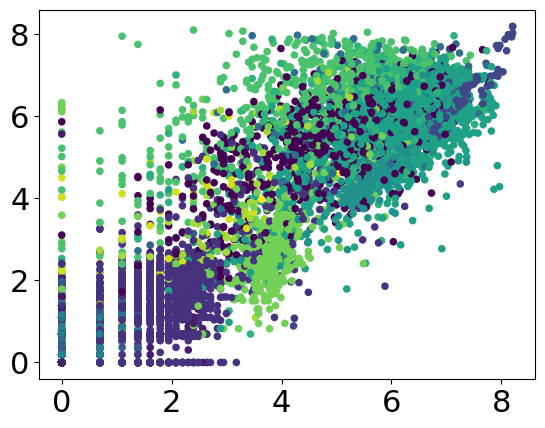

retweet_count_mean - retweet_count_std


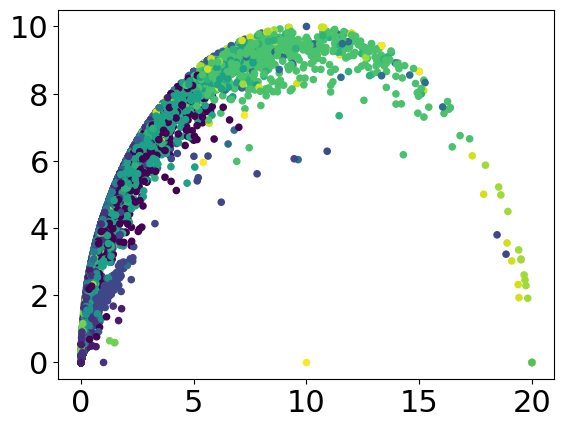

retweet_count_mean - retweet_count_entropy


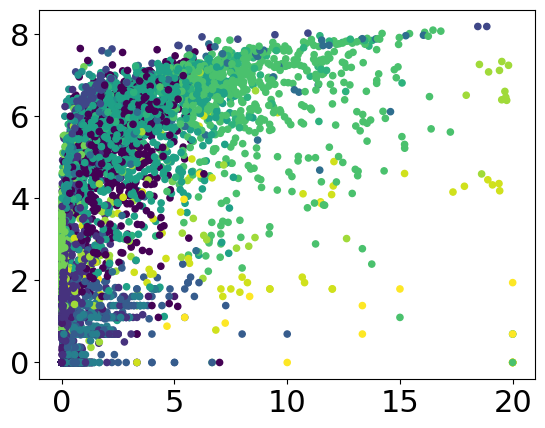

retweet_count_std - retweet_count_entropy


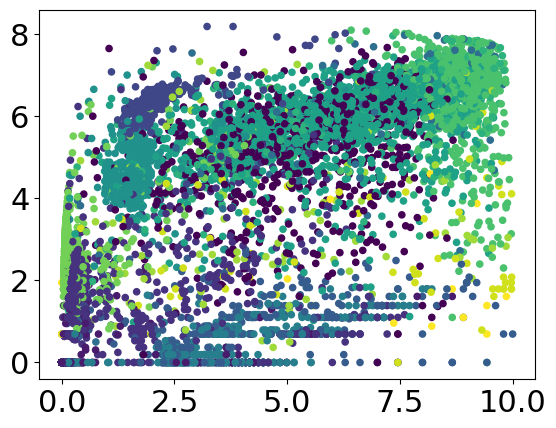

In [24]:
scatter_features_clusters(df_num, kmeans)

## PCA
Apply PCA to visualize the scatter plot distribution of the clustered data

In [25]:
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

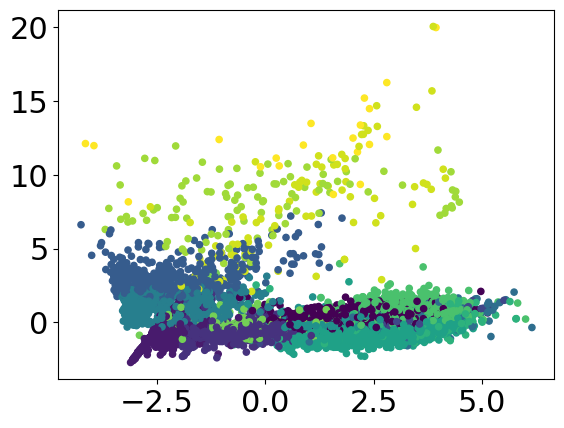

In [26]:
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c=kmeans.labels_, s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

## Additional Clustering Method :  Fuzzy C-Means

Class represents Fuzzy C-means (FCM) clustering algorithm.

Fuzzy clustering is a form of clustering in which each data point can belong to more than one cluster.

Fuzzy C-Means algorithm uses two general formulas for cluster analysis. The first is to updated membership of each point:

\[w_{ij}=\frac{1}{\sum_{k=0}^{c}\left ( \frac{\left \| x_{i}-c_{j} \right \|}{\left \| x_{i}-c_{k} \right \|} \right )^{\frac{2}{m-1}}}\]

The second formula is used to update centers in line with obtained centers:

\[c_{k}=\frac{\sum_{i=0}^{N}w_{k}\left ( x_{i} \right )^{m}x_{i}}{\sum_{i=0}^{N}w_{k}\left ( x_{i} \right )^{m}}\]



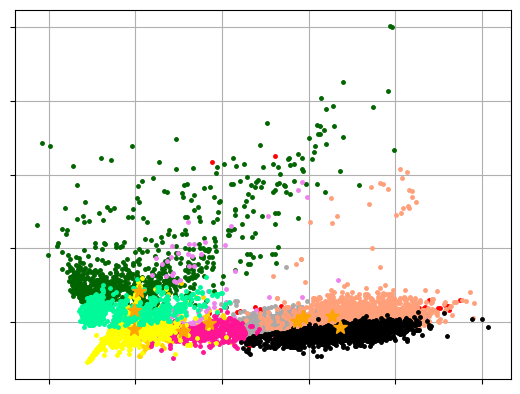

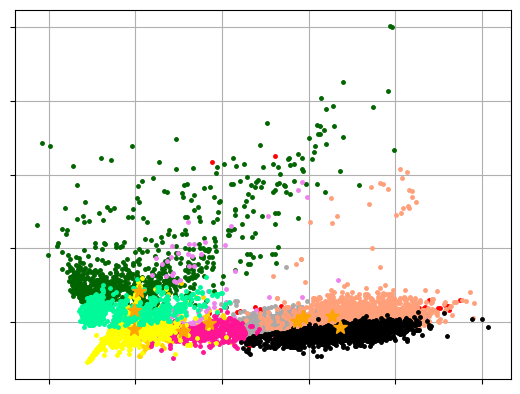

In [27]:
from pyclustering.samples.definitions import FAMOUS_SAMPLES
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.center_initializer import kmeans_plusplus_initializer
from pyclustering.cluster.fcm import fcm
from pyclustering.utils import read_sample
  
# initialize
initial_centers = kmeans_plusplus_initializer(X, 15, kmeans_plusplus_initializer.FARTHEST_CENTER_CANDIDATE).initialize()
 
# create instance of Fuzzy C-Means algorithm
fcm_instance = fcm(X, initial_centers)
 
# run cluster analysis and obtain results
fcm_instance.process()
clusters = fcm_instance.get_clusters()
centers = fcm_instance.get_centers()

 
# visualize clustering results
visualizer = cluster_visualizer()
visualizer.append_clusters(clusters, X_reduced)
visualizer.append_cluster(pca.transform(centers), marker='*', markersize=10)
visualizer.show()

## Additional Clustering Method : K-Medoids

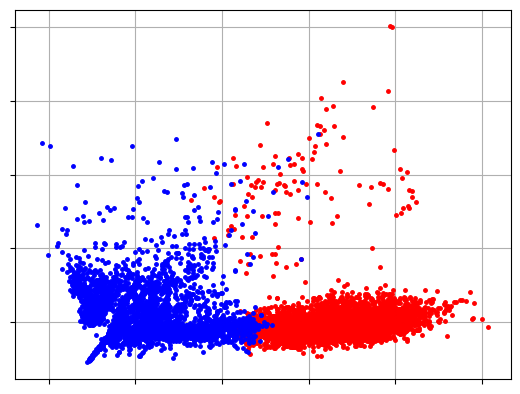

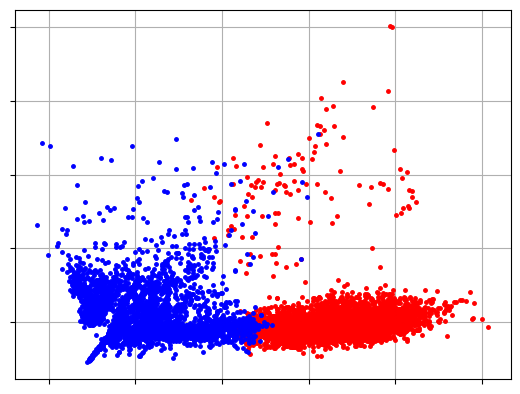

In [28]:
from pyclustering.cluster import cluster_visualizer
from pyclustering.cluster.somsc import somsc
from pyclustering.samples.definitions import FCPS_SAMPLES
from pyclustering.utils import read_sample
  
# Create instance of SOM-SC algorithm to allocated two clusters
somsc_instance = somsc(X, 2)
 
# Run cluster analysis and obtain results
somsc_instance.process()
clusters = somsc_instance.get_clusters()
 
# Visualize clustering results.
visualizer = cluster_visualizer()
visualizer.append_clusters(clusters, X_reduced)
visualizer.show()

In [32]:
# transform clusters to numpy array labels as kmeans-skleanr ones.
clusters

2

In [30]:
kmeans.labels_

array([2, 2, 1, ..., 1, 2, 8], dtype=int32)

In [31]:
# adapt the score function

print('SSE %s' % kmeans.inertia_)
print('Silhouette %s' % silhouette_score(X, kmeans.labels_))
print('Separation %s' % metrics.davies_bouldin_score(X, kmeans.labels_))

SSE 39545.40389553592
Silhouette 0.3728338880926001
Separation 1.0985885372693638
